In [25]:
# PART OF THIS CODE IS FROM MICHAEL MURPHY - THANKS!
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
from collections import OrderedDict
import glob
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os, sys
import glob, re
import seaborn as sns
pd.set_option('display.max_rows', 500) 
pd.set_option('display.max_columns', 100)

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV, StratifiedKFold, cross_val_score, train_test_split
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.utils.multiclass import type_of_target # used to check the Y labels are appropriate for classification
from sklearn.metrics import roc_curve
from sklearn import metrics
from sklearn.utils import shuffle
from scipy import interp

In [26]:
def scatterplot(xs, ys, ss, cs, ls, sscale=1, sbins=None):
    ax = plt.gca()
    cm = plt.get_cmap('rainbow')
    for i, c in enumerate(cs.unique()):
        ax.scatter(xs[cs==c],
                    ys[cs==c],
                    s=ss*sscale if isinstance(ss,int) else ss[cs==c]*sscale,
                    c=cm(1.*i/len(cs.unique())),
                    edgecolor='k',
                    alpha=0.9,
                    vmin=0, vmax=len(cs.unique()),
                   label='_nolegend_')
        ax.scatter([],[],c=cm(1.*i/len(cs.unique())),edgecolor='k',label=c)
    ax.scatter([],[],marker='None',label=' ')
    if not isinstance(ss,int):
        for s in sbins:
            ax.scatter([],[],c='k',edgecolor='k',s=s*sscale,label=str(s))
            ax.scatter([],[],marker='None',label=' ')
    for x, y, l in zip(xs, ys, ls):
        ax.text(x, y, l, color='k', ha='center', va='center')
    ax.set_xlabel(xs.name)
    ax.set_ylabel(ys.name)
    ax.legend()
    ax.grid()

In [17]:
#### Use this if DOING a fresh modeling fitting analysis
bn = True # use the percentile normalized data or no? 
log = False
stand_scaler = False
reanalysis = True
model = 'log_reg' #log_reg, rf or svm

if reanalysis:
    pre_norm_ds = [ 'plasmaall_author',
                    'urineall_author',
                    'm_oxylipin_chronic_hep_b',
                    'm_chronic_hep_b_POS',
                    'm_chronic_hep_b_NEG',
                    'm_CER_mass_spectrometry_v4',
                    'm_CER_mass_spectrometry_v4_3_CS',
                    'm_CER_mass_spectrometry_v4_0_NS',
                    'm_CER_mass_spectrometry_v4_2_FS',
                    'm_CER_mass_spectrometry_v4_1_COPD',
                    'm_EICO_mass_spectrometry_v4',
                    'm_EICO_mass_spectrometry_v4_3_CS',
                    'm_EICO_mass_spectrometry_v4_0_NS',
                    'm_EICO_mass_spectrometry_v4_2_FS',
                    'm_EICO_mass_spectrometry_v4_1_COPD',
                    'AN000580',
                    'AN000581',
                    'AN001503',
                    'ulsam_author']

    if bn:
#         path = './bn_pickles/*.pkl'
        path = './pickles/MTBLS124_15yr_MCI*.pkl'
#         path = './bn_pickles/MTBLS72*.pkl'
    else:
#         path = './pickles/*.pkl'
#         path = './pickles/MTBLS124_5yr_MCI_data.pkl'

    datasets = OrderedDict()
    for fn in sorted(glob.glob(path)):
        data = pd.read_pickle(open(fn,'rb'))
        datasets[data[0]['study']] = data
    
else:
    #### Use this if NOT doing a fresh modeling fitting analysis
    pickle_file = './YES_bn_ds_models_and_sigfeat_NO_log_NO_standscal_NO_multi_mapped_labels.pkl'
    ### The non-batch corrected pickle for the dataset
    # pickle_file = './NO_bn_dataset_models_and_sigfeat_YES_log.pkl'
    datasets = pickle.load(open(pickle_file, 'rb'))
    

In [18]:
from scipy.stats import mannwhitneyu
from scipy.stats import kruskal
from statsmodels.stats.multitest import multipletests

def get_num_labels(ds):
    ds['labels'] = ds['labels']*1
    vals = ds['labels'].values
    try:
        vals = [item for sublist in vals for item in sublist]
    except:
        pass
    labels = set(vals)
    ds['num_labels'] = len(labels)
    ds['label_set'] = labels
    return ds

def check_pre_norm(ds):
    if ds['data_set'] in pre_norm_ds:
        ds['pre_norm'] = 'Yes'
    else:
        ds['pre_norm'] = 'No'
    return ds

def convert_nan_to_val(data, value=0):
    data[pd.isnull(data)] = value
    return data

def fdr_corrected_p(dataset, fill_nan=False, log=False):
    X = dataset['features'].values.copy()
    # tuning the data with nan filling to 0, changing 0s to a diff number and or applying log transform
    X[np.isinf(X)] = 0
    X[X<0] = 0
    if fill_nan:
        X = convert_nan_to_val(X, value=0)
    if log and dataset['pre_norm'] == 'No':
        X[X<1] = 1
        X = np.log2(X)
    
    y = dataset['labels'].values.ravel()
    y = np.asarray([int(i) for i in y])
    p = np.zeros(X.shape[1]) + np.nan
    
    for i in range(X.shape[1]):
        feat_data = []
        for j in ds['label_set']:
            try:
                X_0 = X[y==j,i]
                X_0 = X_0[~np.isnan(X_0)]
                feat_data.append(X_0)
            except:
                pass 
        ### do MW-U or kruskal but first find places were vectors all the same. 
        if ds['num_labels'] == 2:
            if set(feat_data[0]) == set(feat_data[1]):
                p[i] = 1
                continue
            else:
                _, p[i] = mannwhitneyu(feat_data[0],feat_data[1], alternative='two-sided')
        else:
            if set(feat_data[0]) == set(feat_data[1]) == set(feat_data[2]):
                p[i] = 1
                continue
            else:
                _, p[i] = kruskal(*feat_data)                       
    try:
        _, p[~np.isnan(p)], _, _ = multipletests(p[~np.isnan(p)], alpha=0.05, method='fdr_bh')
    except:
        pass
    dataset['pvalues'] = p
    dataset['significant'] = (dataset['pvalues'] < 0.05).sum() if (~np.isnan(p)).any() else np.nan

In [19]:
for k, v in datasets.items():
    for ds in v:
#         if bn:
#             ds['labels'] = pd.DataFrame(ds['labels'])
#             ds['features'] = pd.DataFrame(ds['features'])
            
#         if ds['data_set'] == 'IPO_aligned_MTBLS92':
#             f = [fi for fi in list(ds['features'].index) if '163' in fi]
#             ds['features'] = ds['features'].loc[f]
#             ds['labels'] = ds['labels'].loc[f]
#         if ds['study'] == 'MTBLS92' and ds['data_set'] == 'Author_data':
#             f = [fi for fi in list(ds['features'].index) if 'A' in fi]
#             ds['features'] = ds['features'].loc[f]
#             ds['labels'] = ds['labels'].loc[f] 
            
        ds = get_num_labels(ds)
        ds = check_pre_norm(ds)
        print(k, ds['data_set'])
        if log:
            fdr_corrected_p(ds, fill_nan=True, log=True)  
        else:
            fdr_corrected_p(ds, fill_nan=True, log=False)

MTBLS124 ulsam_author
MTBLS124 ulsam_IPO_reprocessedfirst
MTBLS124 ulsam_IPO_reprocessedsecond
MTBLS124 ulsam_IPO_reprocessedmean
MTBLS124 ulsam_IPO_reprocessedfirst_mean
MTBLS124 ulsam_IPO_reprocessedsecond_mean


In [20]:
def train_model(X,y,ds,model):
    X,y = shuffle(X,y)
    if model == 'log_reg':
        if ds['num_labels'] != 2:
            clf = LogisticRegressionCV(scoring='accuracy', penalty='l1', solver='liblinear', tol=1e-4, intercept_scaling=1, max_iter=500, multi_class='ovr')
        else:
            clf = LogisticRegressionCV(scoring='roc_auc', penalty='l1', solver='liblinear', tol=1e-4, intercept_scaling=1, max_iter=500)
    elif model == 'rf':
        param_grid = {'n_estimators':[100,500,1000]}
        clf = GridSearchCV(RandomForestClassifier(n_estimators=1000, n_jobs=-1), param_grid, cv=3, n_jobs=-1)
    elif model == 'svm':
        param_grid = {'gamma': [1e-3, 0.01, 0.1, 1], 'C': [0.01, 0.1, 1, 10, 100]}
        clf = GridSearchCV(SVC(kernel='linear', probability=True), param_grid, cv=3, n_jobs=-1)
    else:
        print('no valid classifier input, please try again with one of: log_reg, rf or svm')
        exit(0)
    cv = StratifiedKFold(n_splits=5, shuffle=True) # so this will probably give rather high - at the end you just get the last model...
    aucs = []
    for train, test in cv.split(X,y):
        x_train, y_train = X[train], y[train]
        x_test, y_test = X[test], y[test]
        if stand_scaler:
            scaler = StandardScaler()
            x_train = scaler.fit_transform(x_train)
            x_test = scaler.transform(x_test)
        clf.fit(x_train, y_train)
        if ds['num_labels'] != 2:
            if ovr_auc:
                # to do one v the rest AUCs:
                y_pred = clf.predict_proba(x_test)
                num_labels = y_pred.shape[1]
                set_to = num_labels+10
                indiv_aucs = []
                for ind in range(y_pred.shape[1]):
                    y_mut = y_test.copy()
                    y_mut[y_mut==ind] = set_to
                    y_mut[y_mut!=set_to] = 0
                    y_mut[y_mut==set_to] = 1
                    fpr, tpr, _ = roc_curve(y_mut, y_pred[:,ind])
                    auc_value = metrics.auc(fpr, tpr)
                    indiv_aucs.append(auc_value)
                aucs.append(indiv_aucs)
            else: aucs.append(clf.score(x_test, y_test))
        else:
            y_pred = clf.predict_proba(x_test)
            fpr, tpr, _ = roc_curve(y_test, y_pred[:,1])
            auc_value = metrics.auc(fpr, tpr)
            aucs.append(auc_value) 
#     x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
#     clf.fit(x_train, y_train)
#     print(aucs)
    auc = np.asarray(aucs)
    if ds['num_labels'] != 2:
        multi_aucs = auc
    else: multi_aucs = 0
    return auc.mean(), auc.std(), clf, y_train.shape, y_test.shape, multi_aucs


# def l1_log_reg(X,y,ds):
#     X,y = shuffle(X,y)
#     if ds['num_labels'] != 2:
#         clf = LogisticRegressionCV(scoring='accuracy', penalty='l1', solver='liblinear', tol=1e-4, intercept_scaling=1, max_iter=500, multi_class='ovr')
#     else:
#         clf = LogisticRegressionCV(scoring='roc_auc', penalty='l1', solver='liblinear', tol=1e-4, intercept_scaling=1, max_iter=500)
#     cv = StratifiedKFold(n_splits=3, shuffle=True)
#     aucs = []
#     for train, test in cv.split(X,y):
#         x_train, y_train = X[train], y[train]
#         x_test, y_test = X[test], y[test]
#         if stand_scaler:
#             scaler = StandardScaler()
#             x_train = scaler.fit_transform(x_train)
#             x_test = scaler.transform(x_test)
#         clf.fit(x_train, y_train)
#         if ds['num_labels'] != 2:
#             if ovr_auc:
#                 # to do one v the rest AUCs:
#                 y_pred = clf.predict_proba(x_test)
#                 num_labels = y_pred.shape[1]
#                 set_to = num_labels+10
#                 indiv_aucs = []
#                 for ind in range(y_pred.shape[1]):
#                     y_mut = y_test.copy()
#                     y_mut[y_mut==ind] = set_to
#                     y_mut[y_mut!=set_to] = 0
#                     y_mut[y_mut==set_to] = 1
#                     fpr, tpr, _ = roc_curve(y_mut, y_pred[:,ind])
#                     auc_value = metrics.auc(fpr, tpr)
#                     indiv_aucs.append(auc_value)
#                 aucs.append(indiv_aucs)
#             else: aucs.append(clf.score(x_test, y_test))
#         else:
#             y_pred = clf.predict_proba(x_test)
#             fpr, tpr, _ = roc_curve(y_test, y_pred[:,1])
#             auc_value = metrics.auc(fpr, tpr)
#             aucs.append(auc_value) 
#     auc = np.asarray(aucs)
#     if ds['num_labels'] != 2:
#         multi_aucs = auc
#     else: multi_aucs = 0
#     return auc.mean(), auc.std(), clf, y_train.shape, y_test.shape, multi_aucs

def fit_model(X,y,ds,model):
    mean, std, clf, train_size, test_size, multi_aucs =  train_model(X,y,ds,model)
    if mean == 1.0 or mean == 0.5:
        mean, std, clf, train_size, test_size, multi_aucs = train_model(X,y,ds,model)
    return mean, std, train_size[0], test_size[0], clf, multi_aucs

In [ ]:
# Used to fit models for all the datasets!
for k, v in datasets.items():  
    for ds in v: 
        print(k, ds['data_set'], ds['features'].shape)
# if multiclass has not been pre-reduced to different one-v-rest datasets do you want to use one-v-rest or true multi class accuracy
        ovr_auc = True
# if working with batch corrected data, must make the labels and data into pd dfs...
#         if bn:
#             ds['labels'] = pd.DataFrame(ds['labels'])
#             ds['features'] = pd.DataFrame(ds['features'])
        ds = get_num_labels(ds)
        ds = check_pre_norm(ds)                
        y = ds['labels'].values.copy().ravel().astype(int)
        X = ds['features'].values.copy()
        X = convert_nan_to_val(X, value=0)
        X[np.isinf(X)] = 0
        X[X<0] = 0
        if log and ds['pre_norm'] == 'No':
            print('using log')
            X[X<1] = 1
            X = np.log2(X)
        aucs = []
        for i in range(30):
            auc, std,train_size,test_size,clf,multi_auc= fit_model(X,y,ds,model)
            aucs.append(auc)
        aucs = np.asarray(aucs)
        ds['auc'] = aucs.mean()
        ds['auc_std'] = aucs.std()
        ds['train_size'], ds['test_size'], ds['clf'], ds['multi_aucs'] = train_size, test_size, clf, multi_auc
#         ds['auc'], ds['auc_std'], ds['train_size'], ds['test_size'], ds['clf'], ds['multi_aucs'] = fit_model(X, y, ds, model=model)     
        print(ds['auc'],ds['auc_std'])

MTBLS124 ulsam_author (1038, 177)


In [ ]:
disease_type = {
    'acute myocardial infarction': 'cardiovascular',
    'cardiovascular': 'cardiovascular',
    'coronary heart disease': 'cardiovascular',
    'hepatocellular carcinoma': 'cancer',
    'Hepatocellular carcinoma': 'cancer',
    'Hepatocellular Carcinoma': 'cancer',
    'hepatitis b': 'infectious',
    'Malaria': 'infectious',
    'Malaria (P. vivax)':'infectious',
    'non-malaria febrile illness':'infectious',
    'scleroderma PAH': 'autoimmune',
    'psoriasis':'autoimmune',
    'pneumonia': 'infectious',
    'Pneumonia - Community acquired': 'infectious',
    'copd': 'respiratory',
    'COPD': 'respiratory',
    'chronic hepatitis B' : 'infectious',
    'typhoid': 'infectious',
    'typhoid carriage':'infectious',
    'lyme': 'infectious',
    'common cold - longitudinal':'infectious',
    'Lyme disease': 'infectious',
    'Alzheimers': 'neurological',
    "Alzheimer's": 'neurological',
    'colorectal cancer': 'cancer',
    'Colorectal Cancer': 'cancer',
    'depression': 'neurological',
    'Depression':'neurological',
    'Breast Cancer': 'cancer',
    'Breast cancer':'cancer',
    'Lung cancer': 'cancer',
    'lung cancer': 'cancer',
    'Lung Cancer': 'cancer',
    'lung cancer - adenocarcinoma': 'cancer',
    'lung cancer - non-small-cell lung cancer (adenocarcinoma, etc)': 'cancer',
    'Stability of dried blood samples - diabetic men' : 'metabolic',
    'Obesity - Non-diabetic and T2 diabetic': 'metabolic',
    't2 diabetes': 'metabolic',
    't1 diabetes': 'metabolic',
    'Diabetes - Type I': 'metabolic',
    'Diabetes - healthy v. T2 v. prediabetic': 'metabolic',
    'Polycystic Ovarian Syndrome': 'metabolic',
    'minimal change disease, focal segmental sclerosis': 'glomerular',
    'interstitial cystitis/painful bladder syndrome': 'other',
    'prepubertal children with obesity': 'other', #MAYBE CHANGE THIS ONE?
    'chronic fatigue syndrome': 'other',
    'Chronic fatigue': 'other',
    'polycystic ovarian syndrome': 'other',
    'scleroderma': 'other',
    'Pregnancy': 'other',
    'smoker v. nonsmoker':'other',
    'Interperson variation':'other',
    'short-term and long-term metabolic changes after bariatric surgery':'other',
    'high intensity exercise metabolomics':'other',
    'Age related metabolomics': 'other',
    'Urine sample storage': 'other',
    'urine metabolome': 'other',
    'Single human time study': 'other'
    }

def make_summary(u,l,i,k,j=0, replace=False):
    if replace:
        auc = u['multi_aucs'].mean(0)[j]
        auc_std = u['multi_aucs'].std(0)[j]
        analysis = u['data_set']+'_'+str(j)
        label = str(l)+str(i)+str(j)
        if model == 'log_reg':
            model_coef = np.count_nonzero(u['clf'].coef_[j])
    else:
        auc = u['auc']
        auc_std = u['auc_std']
        analysis = u['data_set']
        label = str(l)+str(i)
        if model == 'log_reg':
            model_coef = np.count_nonzero(u['clf'].coef_)
    s = {'disease': u['disease'], 
        'number_labels': 2,
        'auc':auc,
        'auc_std': auc_std,
        'samples': u['features'].shape[0],
        'significant': u['significant'],
        'features': u['features'].shape[1],
        'train_size': u['train_size'],
        'test_size': u['test_size'],
        'label': label,
        'case': summed_case,
        'control': summed_control,
        'analysis': analysis,
        'disease_type': disease_type[u['disease']],
        'study': k}
    if model == 'log_reg':
        s['model_nonzero_coef'] = model_coef
    return s
    
from string import ascii_letters
summary = []
for l,k in zip(ascii_letters, datasets):
    for i, u in enumerate(datasets[k]):
        if (k == 'ST000062' and u['data_set'] == 'XCMS-Report-annotated-SingleClass-GCTOF.'):
            u['data_set'] = 'XCMS-Report-annotated-SingleClass-GCTOF.plasma'
        if u['num_labels'] == 2:
            control = u['labels']==0
            case = u['labels']==1
            try:
                summed_control = int(control.sum())
                summed_case = int(case.sum())
            except:
                pass
            summary.append(make_summary(u,l,i,k))
        else:
            for j in range(u['num_labels']):
                summary.append(make_summary(u,l,i,k,j=j,replace=True))
                #### Issues with multi class: the case and control just use the last datasets values, not real                      
summary = pd.DataFrame(summary)
# summary = summary.set_index('study')
# summary['disease_type'] = summary['disease_type'].astype('category')
summary

In [ ]:
# save the df as a csv:
summary.to_csv('./10yr_MTBLS124_30avg_auc_{}_sigfeat_summary_YES_bn_NO_log_NO_standscal_YES_ovo.csv'.format(model))
# save the df as a pickle
summary.to_pickle('./10yr_MTBLS124_30avg_auc_{}_sigfeat_df_YES_bn_NO_log_NO_standscal_YES_ovo.pkl'.format(model))
# save dataset object:
pickle.dump(datasets, open('./10yr_MTBLS124_30avg_{}_YES_bn_ds_models_and_sigfeat_NO_log_NO_standscal_YES_ovo.pkl'.format(model), 'wb'))

In [ ]:
# map the extra metadata onto this data (column, mode, sample type)
# metadata = pd.read_csv('./ms_instrument_column_polarity_dataset_names.csv', sep='\t')
metadata = pd.read_csv('./ms_instrument_column_polarity_dataset_names.csv', sep='\t').set_index('Accession')
summary_w_metadata = summary.merge(metadata, on='analysis')
summary_w_metadata = summary_w_metadata.replace(np.nan,'unknown')
summary_w_metadata.to_csv('./10yr_MTBLS124_30avg_{}_auc_sigfeat_summary_YES_bn_NO_log_NO_standscal_YES_ovo_YES_meta.csv'.format(model))
summary_w_metadata

In [11]:
##### FOR THE REST JUST LOAD IN WHATEVER DATASET YOU WANT TO WORK ON....
summary_no_bn = pd.read_csv('./auc_sigfeat_summary_NO_bn_YES_log_YES_standscal_NO_multi_mapped_labels.csv')
summary_bn = pd.read_csv('./auc_sigfeat_summary_YES_bn_NO_log_NO_standscal_NO_multi_mapped_labels.csv')

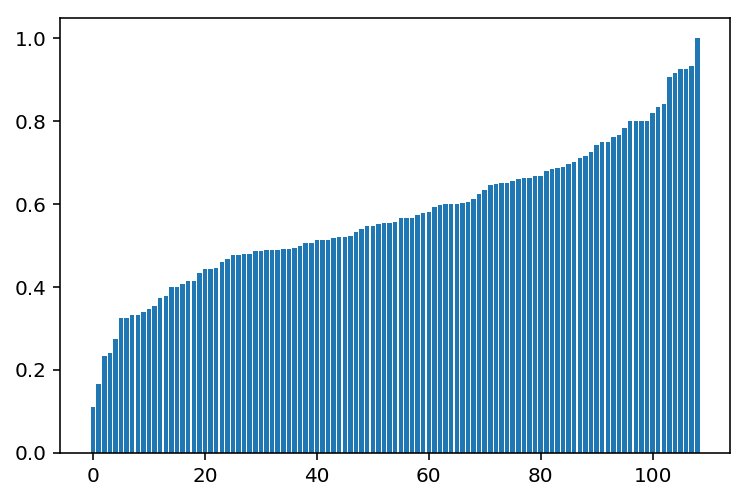

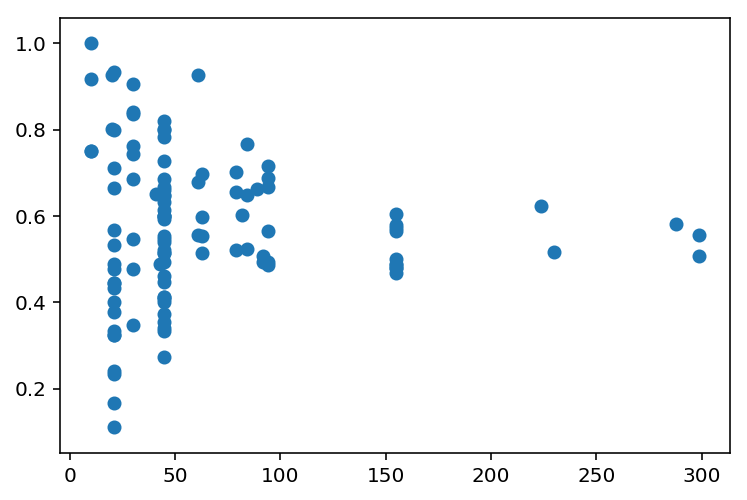

,auc,significant,samples,study
8,0.662061,0,89,MTBLS105
11,0.552574,0,63,MTBLS17
12,0.750000,0,10,MTBLS17
14,0.697488,0,63,MTBLS17
15,1.000000,0,10,MTBLS17
19,0.598775,0,63,MTBLS17
20,0.750000,0,10,MTBLS17
22,0.514093,0,63,MTBLS17
23,0.916667,0,10,MTBLS17
27,0.649802,0,45,MTBLS19


In [34]:
# get aucs and dataset sizes where number of stat sig feats is zero:
zero_sig_feat = summary_bn[['auc', 'significant', 'samples', 'study']]
zero_sig_feat = zero_sig_feat.loc[zero_sig_feat['significant']==0]
plt.bar([i for i in range(zero_sig_feat.shape[0])], sorted(zero_sig_feat.auc))
plt.show()
plt.scatter(zero_sig_feat.samples, zero_sig_feat.auc)
plt.show()
zero_sig_feat

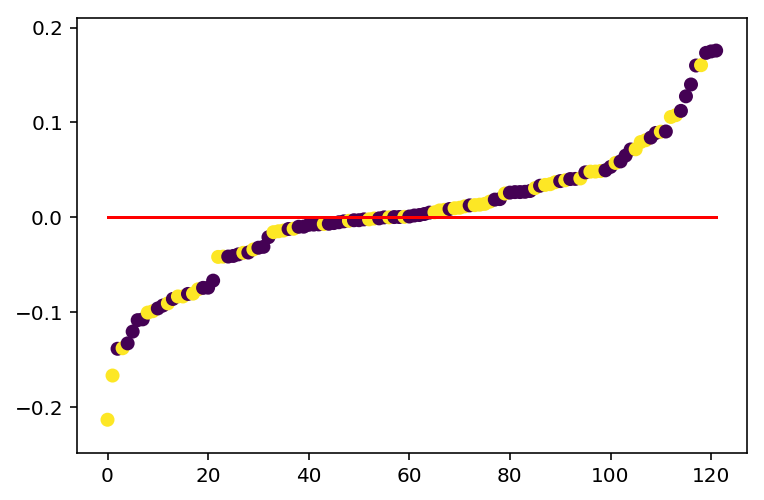

In [12]:
# have summary_no_log and summary (with log on the IPO files):
# see what changes there are 
batches = ['Feng', 'MTBLS17', 'MTBLS19', 'MTBLS72', 'MTBLS92', 'MTBLS105',
           'MTBLS146', 'ST000046', 'ST000421', 'ST000763', 'ST000865']

s_no_bn = summary_no_bn.copy()
s_bn = summary_bn.copy()
no_original_multi = True
s_no_bn = df_no_multi(s_no_bn, no_original_multi)
s_bn = df_no_multi(s_bn, no_original_multi)
        
auc_df = pd.concat([s_no_bn.study, s_no_bn.analysis, s_no_bn.auc,s_bn.auc],axis=1)
auc_df['delta_auc'] = s_bn.auc - s_no_bn.auc
batch = []
for ele in auc_df.study:
    if ele in batches:
        batch.append(1)
    else:
        batch.append(0)
auc_df['batch_effect'] = batch
auc_df = auc_df.sort_values(by=['delta_auc'])
auc_df = auc_df.reset_index()

plt.scatter([i for i in range(len(list(auc_df.index)))], auc_df.delta_auc, c=auc_df.batch_effect)
plt.plot(auc_df.index, [0 for i in auc_df.index], 'r')
plt.show()
# auc_df

Compare number significant features under: <Br>
    1) no data manipulation <Br>
    2) nan filled to 0 <Br>
    3) nan filled to 1 and then log transformed<Br>
    2) log transform<Br>
    3) standardization<Br>
   

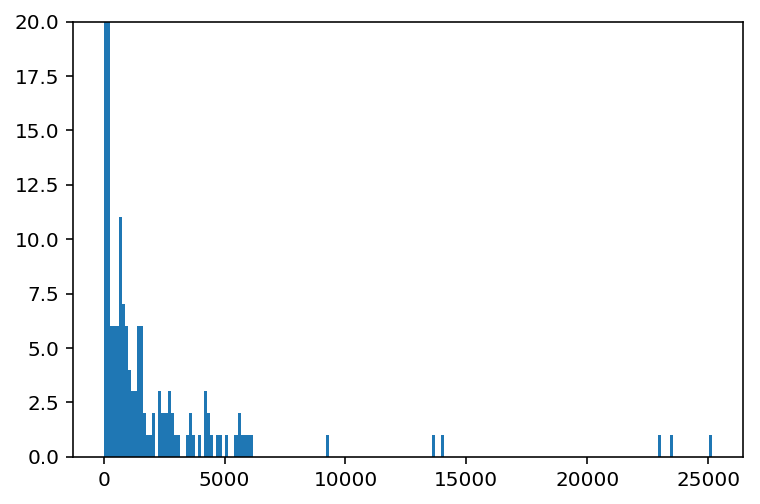

In [76]:
# summary_w_2 = summary_bn[summary_bn.number_labels == 2]
# s = summary_bn.copy()
s = summary_no_bn.copy()
no_original_multi = True
s= df_no_multi(s, no_original_multi)

# fig, ax1 = plt.subplots(1,1,figsize=(10,8))
# # ax1.set_xlim([1,5e4])
# # ax1.set_ylim([1,4000])
# scatterplot(summary_w_auc.features,
#                 summary_w_auc.model_nonzero_coef,
#                 200,
#                 summary_w_auc.disease_type,
#                 summary_w_auc.label)
# ax1.set_xlabel('Total number of features')
# ax1.set_xscale('log')
# # ax1.set_yscale('log')
# ax1.set_ylabel('Fraction of input features used in model')

plt.hist(s.model_nonzero_coef, bins=200)
# plt.xscale('log')
plt.ylim([0,20])
plt.show()

# fig, ax1 = plt.subplots(1,1,figsize=(10,8))
# scatterplot(summary_w_auc.significant/summary_w_auc.features,
#                 summary_w_auc.auc,
#                 200,
#                 summary_w_auc.disease_type,
#                 summary_w_auc.label)
# ax1.set_xlabel('Fraction of significant features')
# ax1.set_ylabel('AUC')

# fig, ax1 = plt.subplots(1,1,figsize=(10,8))
# scatterplot(summary_w_auc.model_nonzero_coef,
#                 summary_w_auc.auc,
#                 200,
#                 summary_w_auc.disease_type,
#                 summary_w_auc.label)
# ax1.set_xlabel('Fraction of significant features')
# ax1.set_ylabel('AUC')

# fig, ax1 = plt.subplots(1,1,figsize=(10,8))
# keep_files = [f for f in list(summary_w_auc.index) if 'IPO' in summary_w_auc['analysis'].loc[f]]
# s = summary_w_auc.loc[keep_files]
# scatterplot(s.significant/s.features,
#                 s.auc,
#                 200,
#                 s.disease_type,
#                 s.label)
# ax1.set_xlabel('Fraction of significant features')
# ax1.set_ylabel('AUC')
# plt.legend(loc='lower right')

# fig, ax1 = plt.subplots(1,1,figsize=(10,8))
# disease = list(summary_w_auc.disease)
# mapping = {}
# count = 0
# number_list = []
# for ele in disease:
#     if ele not in mapping:
#         mapping[ele] = count
#         count += 1
#     number_list.append(mapping[ele])
# print(len(number_list))
# print(len(disease))
# plt.scatter(summary_w_auc['significant'], summary_w_auc['auc'], c=number_list)
# ax1.set_xlabel('Number of significant features')
# ax1.set_ylabel('AUC')
# ax1.set_xscale('log')
# ax1.set_xlim([1,1e5])
# ax1.set_xscale('log')
# ax1.set_xlim([0.1,50000])

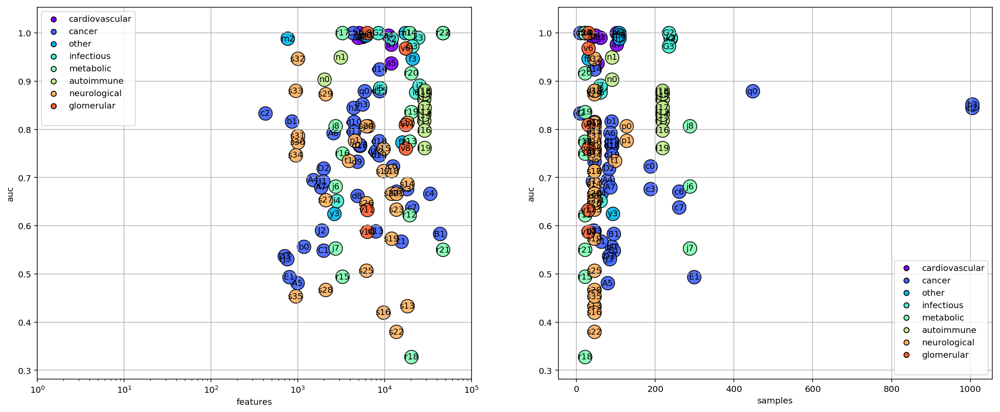

In [33]:
no_original_multi = False
s_no_bn = summary_no_bn.copy()
s_bn = summary_bn.copy()
s_no_bn = df_no_multi(s_no_bn, no_original_multi)
s_bn = df_no_multi(s_bn, no_original_multi)
# summary_w_auc = s_bn.copy()
summary_w_auc = s_no_bn.copy()

def make_auc_v_feat_samp(df):
    fig, axes = plt.subplots(1,2,figsize=(20,8))
    plt.sca(axes[0])
    scatterplot(df.features,
                df.auc,
                250,
                df.disease_type,
                df.label)
    axes[0].set_xscale('log')
    axes[0].set_xlim([1,1e5])
    plt.sca(axes[1])
    scatterplot(df.samples,
                df.auc,
                250,
                df.disease_type,
                df.label)
    
summary_w_auc = filter_df(summary_w_auc, 'reprocessed')
make_auc_v_feat_samp(summary_w_auc)

# summary_w_auc = filter_df(summary_w_auc, 'author')
# make_auc_v_feat_samp(summary_w_auc)


Look at how inside a study the auc is different for reprocessed vs not:
    1) Bar plot for each study individually with the bars color as author or reprocessed
    2) a difference plot with all studies on it comparing changes between mapping datasets

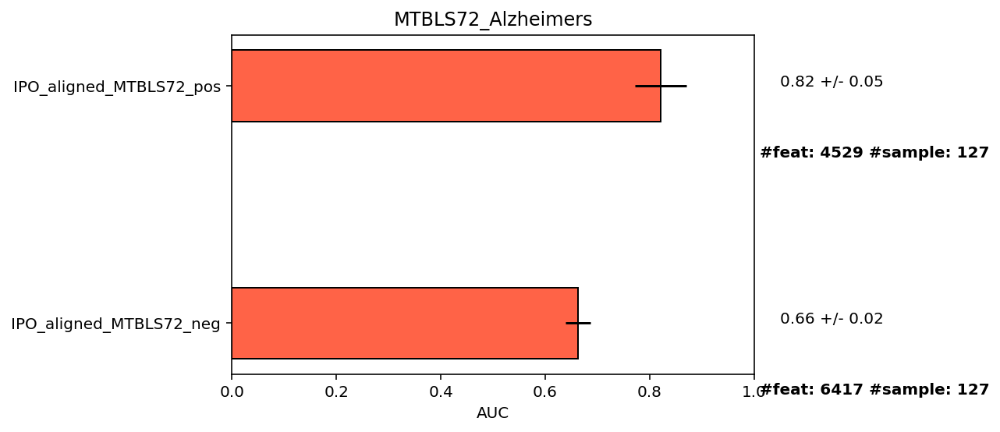

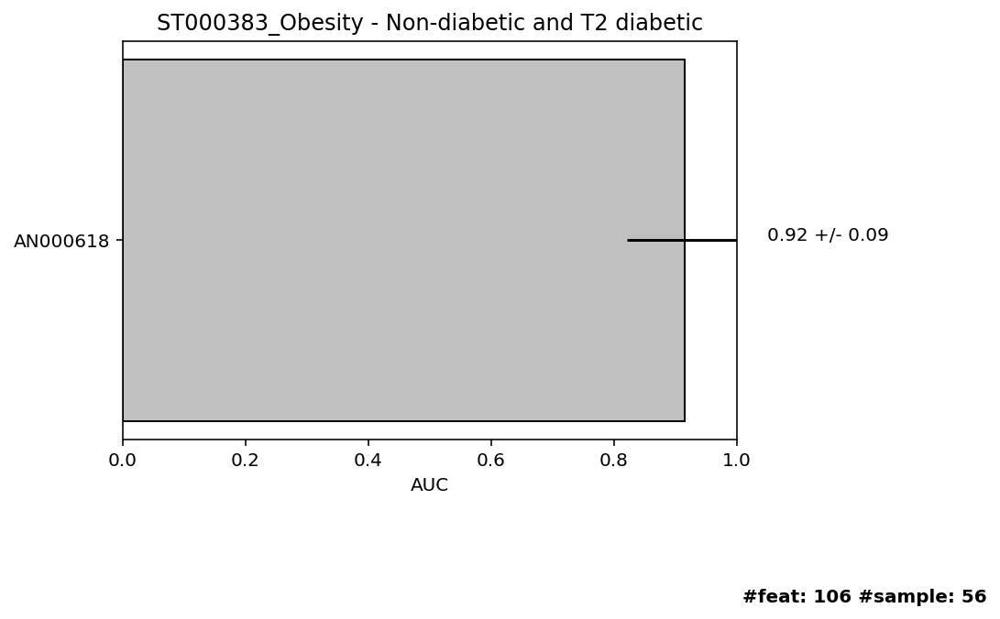

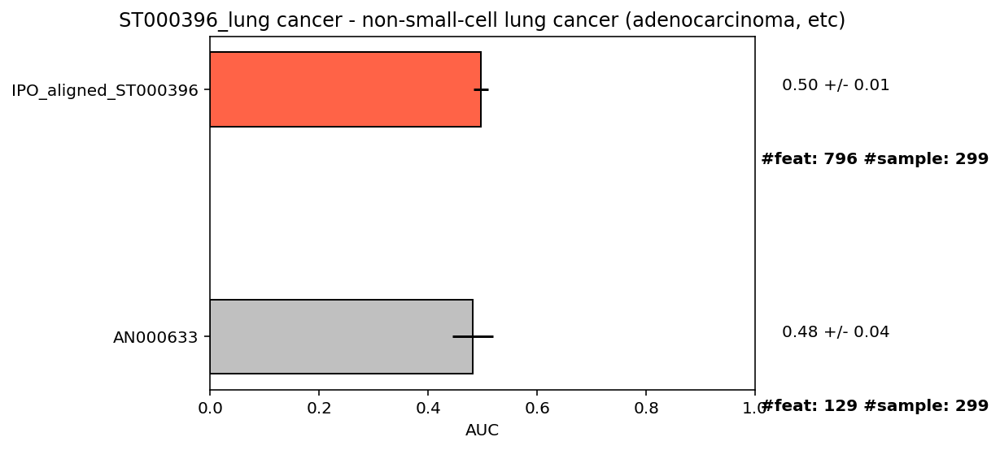

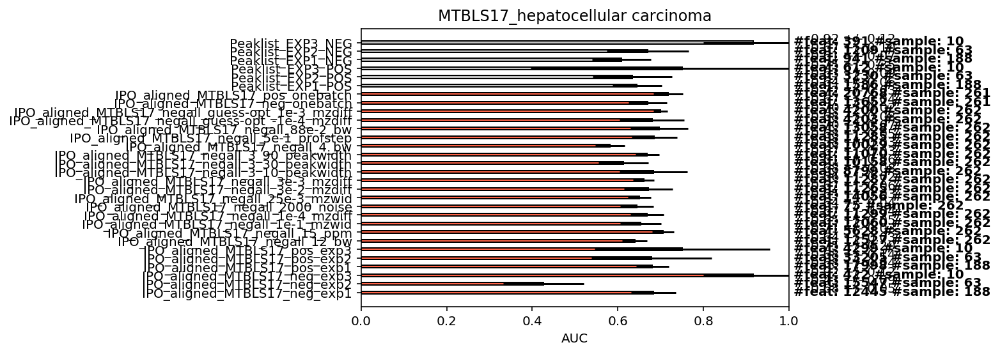

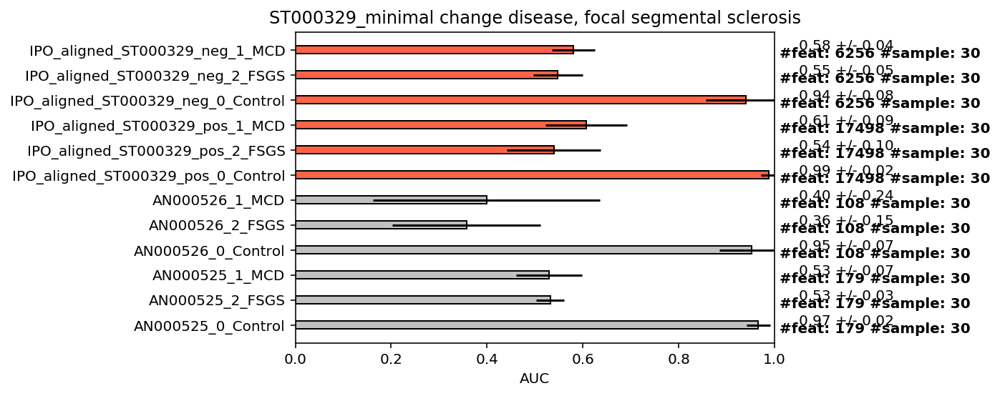

...

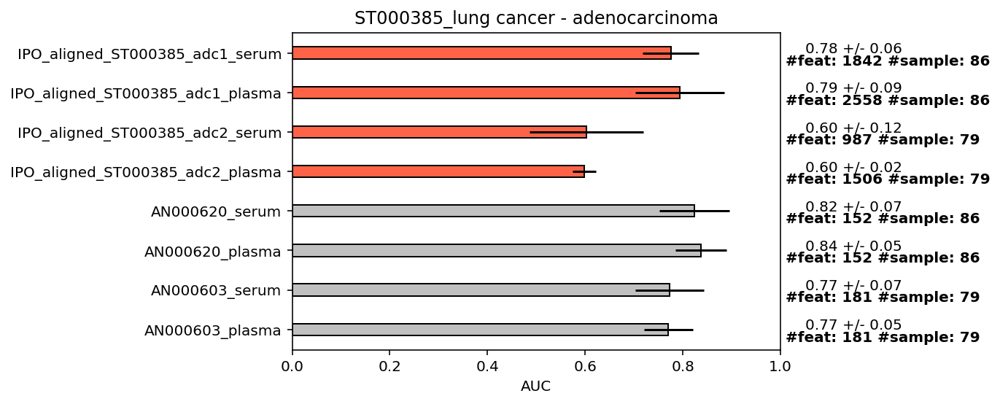

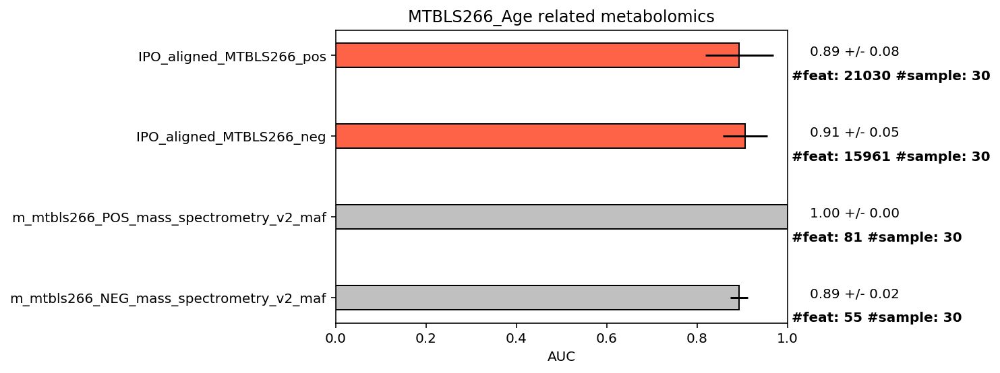

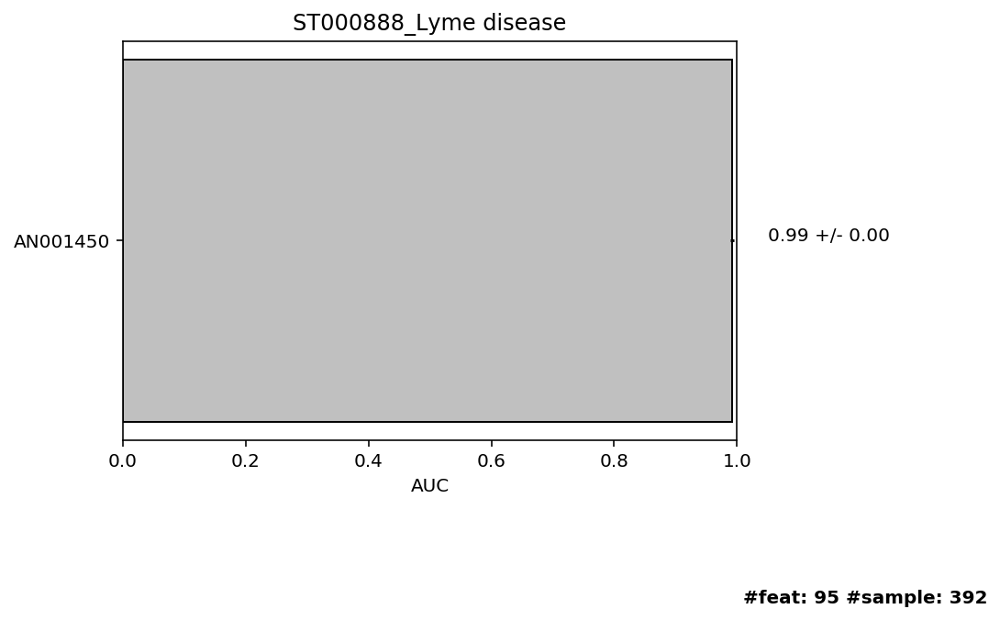

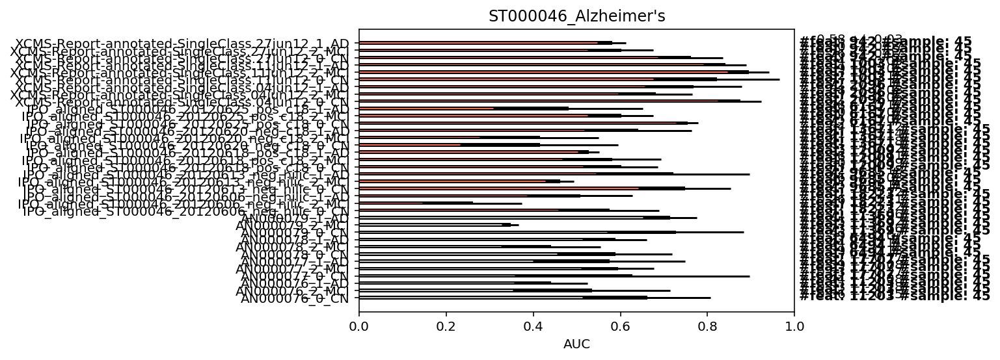

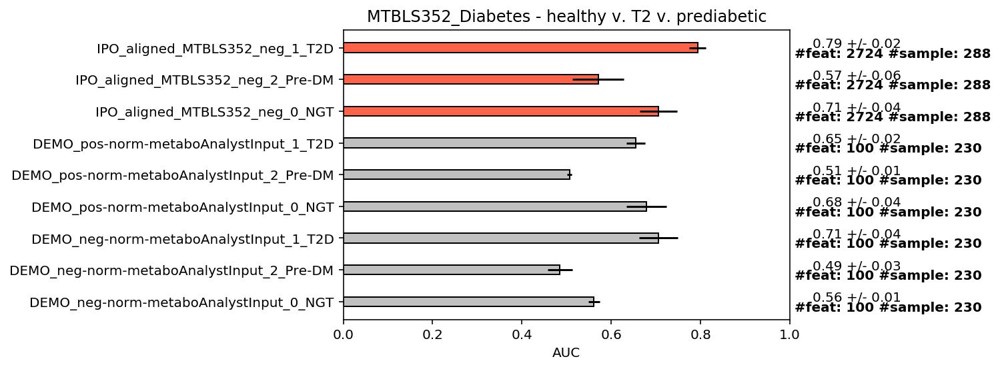

In [24]:
# working with: summary_w_auc
summary_w_auc = summary_w_metadata.copy()
studies = set(list(summary_w_auc['study']))
for study in studies:
    fig, ax = plt.subplots()
    study_data = summary_w_auc[summary_w_auc['study']==study]
    names = list(study_data.analysis)
    colors = ['tomato' if 'IPO' in n or 'XCMS' in n else 'silver' for n in names]
    ax.barh(np.arange(study_data.shape[0]), study_data['auc'], height=0.3, xerr=study_data['auc_std'], color=colors, edgecolor='0')
    for i, v in enumerate(list(study_data.index)):
        ax.text(1.01, i-0.3, '#feat: '+str(study_data['features'].loc[v])+' #sample: '+str(study_data['samples'].loc[v]), fontweight='bold')
        ax.text(1.05, i, '%0.2f +/- %0.2f' %(study_data['auc'].loc[v], study_data['auc_std'].loc[v]))
    plt.yticks(np.arange(study_data.shape[0]), names)
    plt.xlabel('AUC')
    plt.title(study_data['study'].iloc[0]+'_'+study_data['disease'].iloc[0])
    plt.xlim([0,1])
#     plt.tight_layout()
    plt.show()

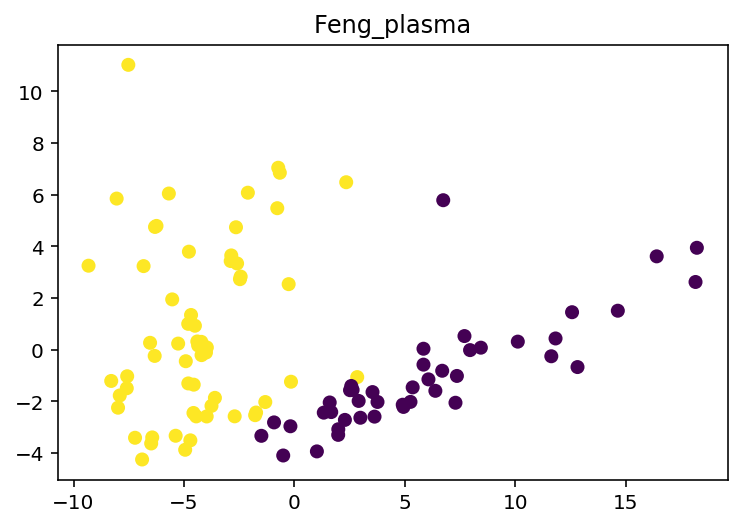

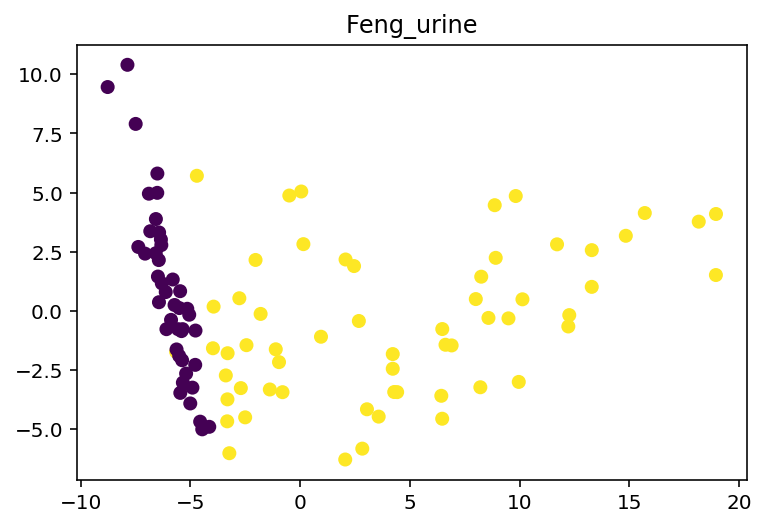

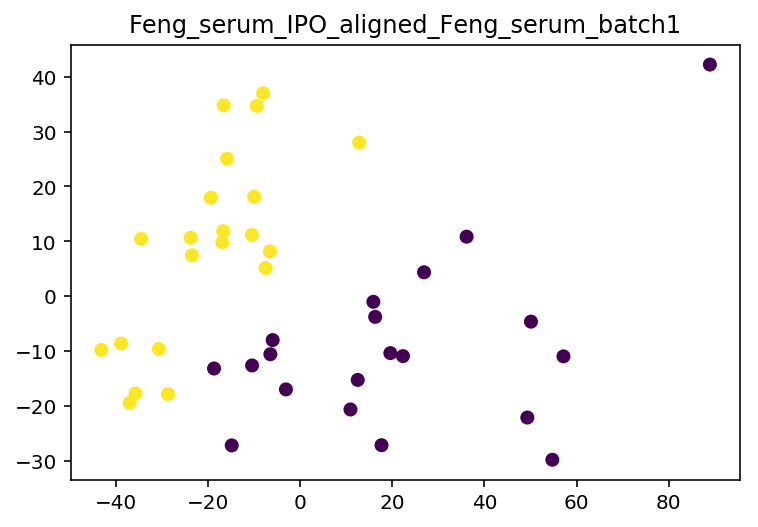

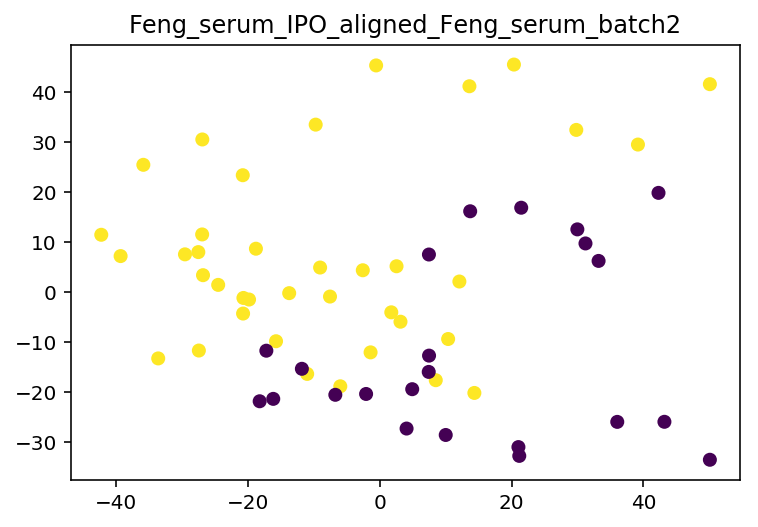

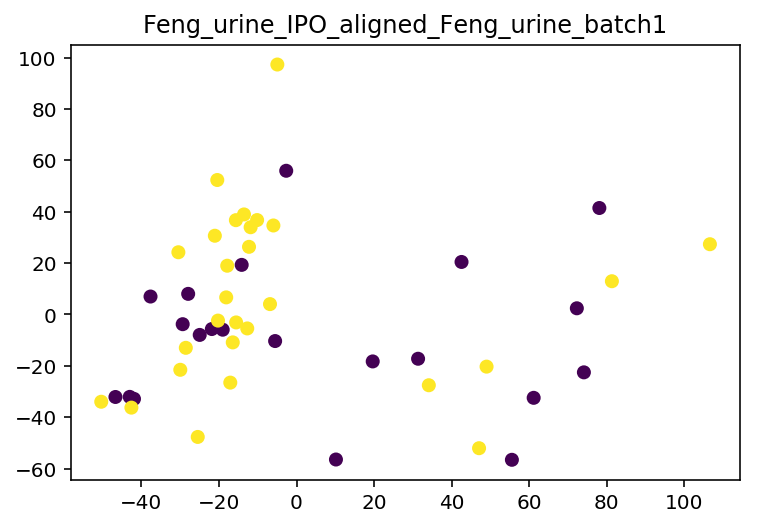

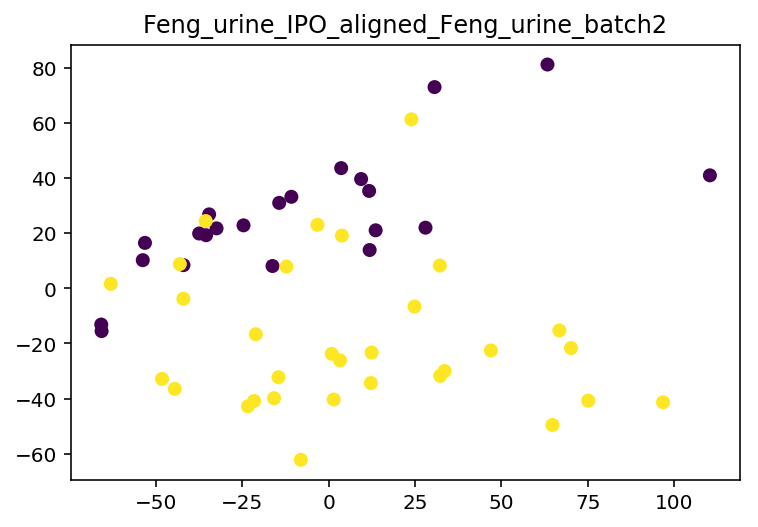

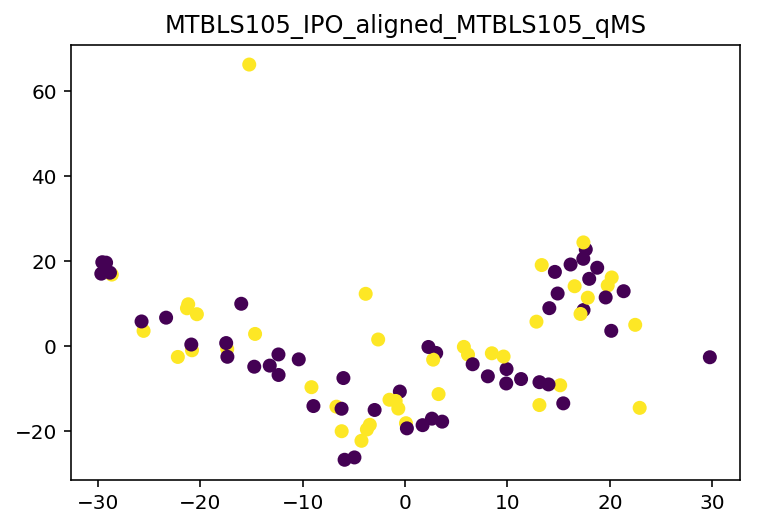

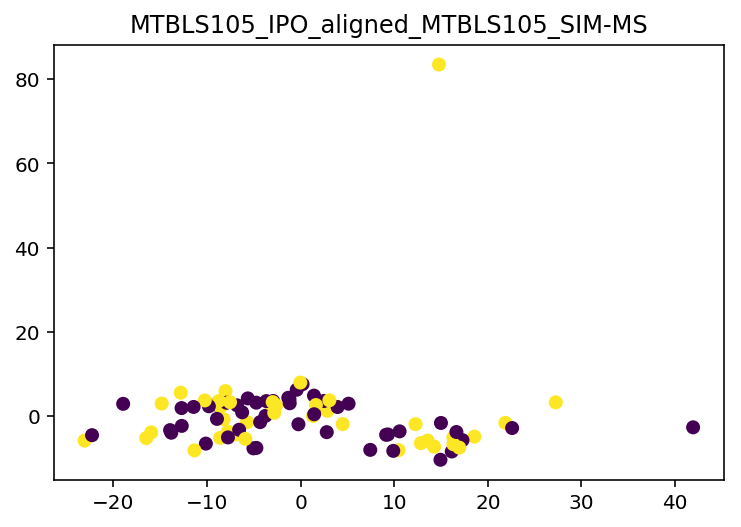

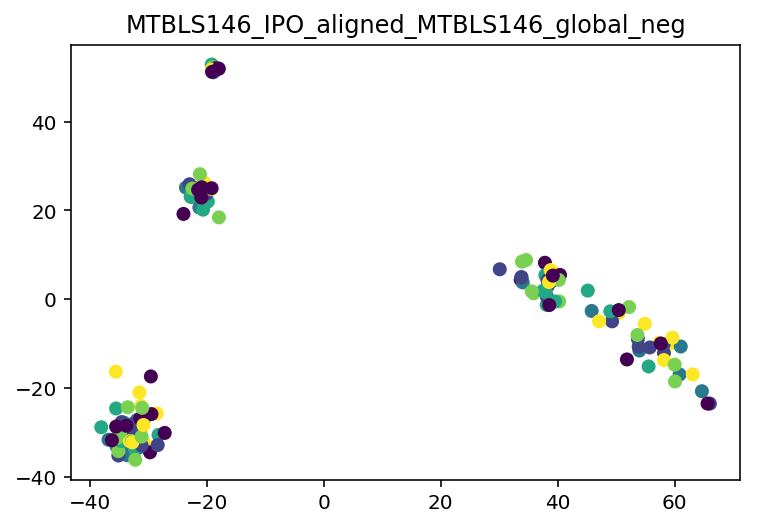

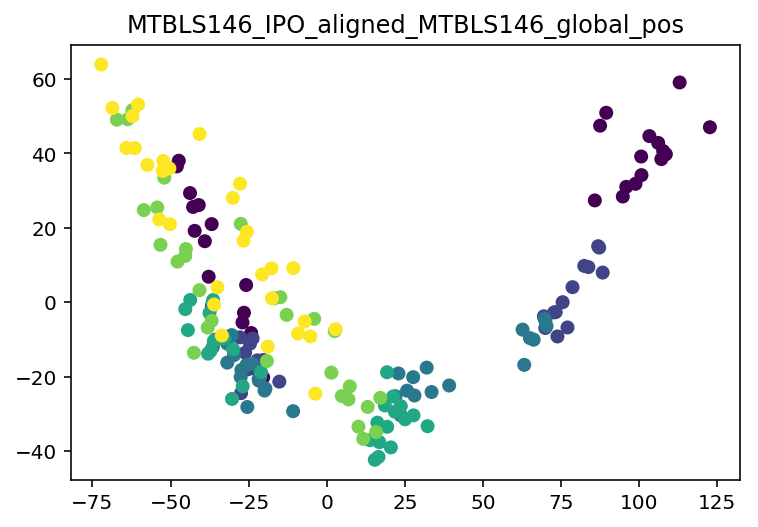

MTBLS148 IPO_aligned_MTBLS148_neg (<class 'ValueError'>, ValueError('c of shape (54,) not acceptable as a color sequence for x with size 27, y with size 27',), <traceback object at 0x7f8c3284bcc8>)
MTBLS148 IPO_aligned_MTBLS148_pos (<class 'ValueError'>, ValueError('c of shape (54,) not acceptable as a color sequence for x with size 27, y with size 27',), <traceback object at 0x7f8c3284b708>)


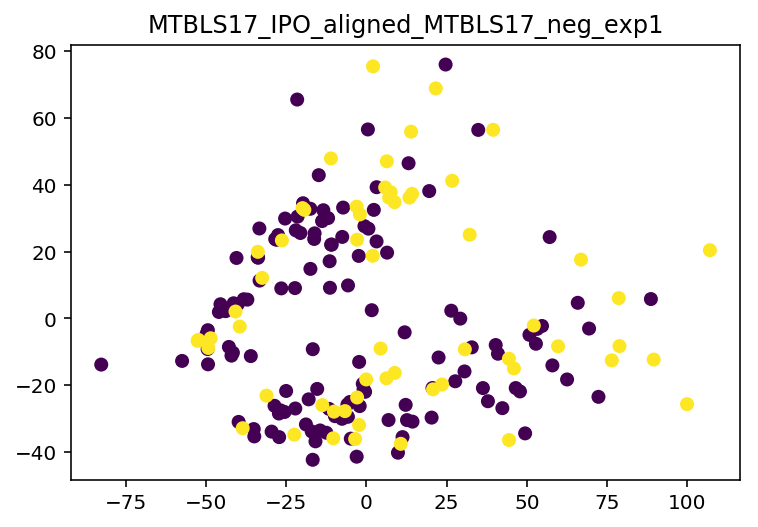

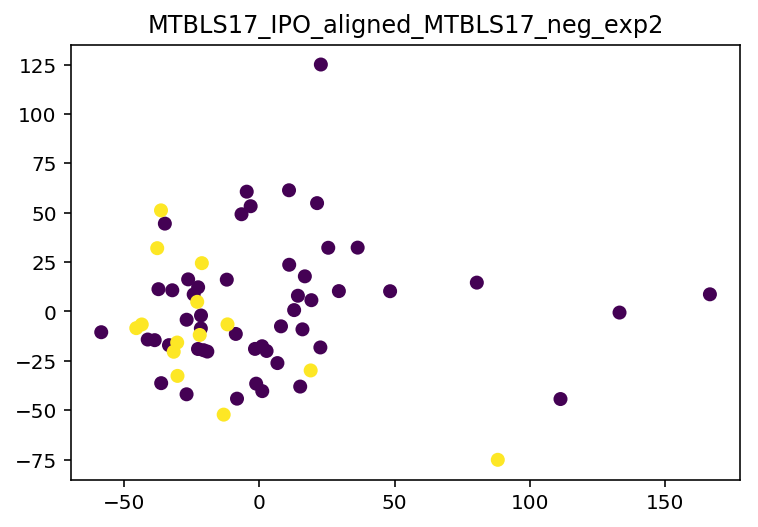

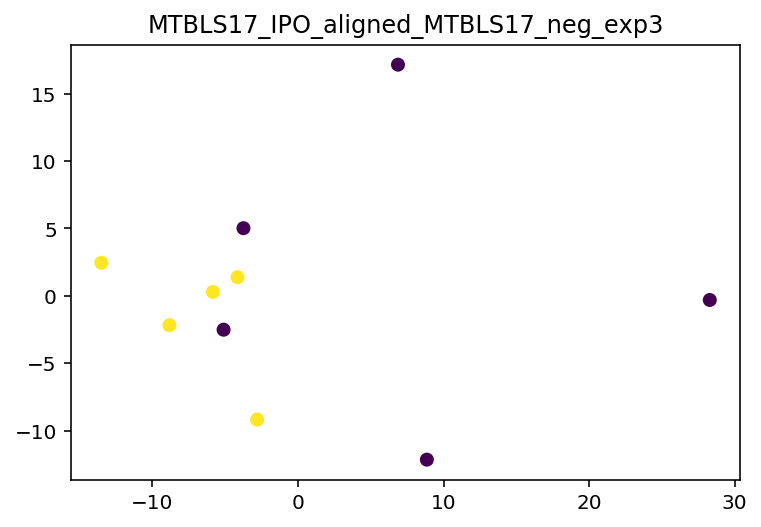

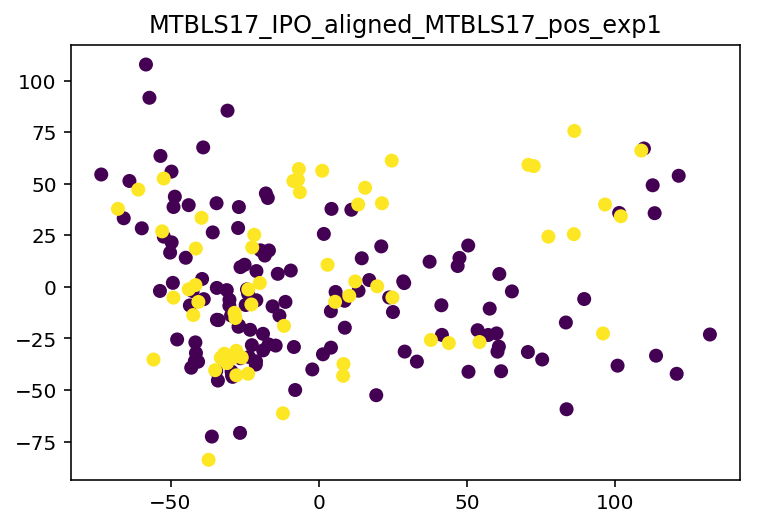

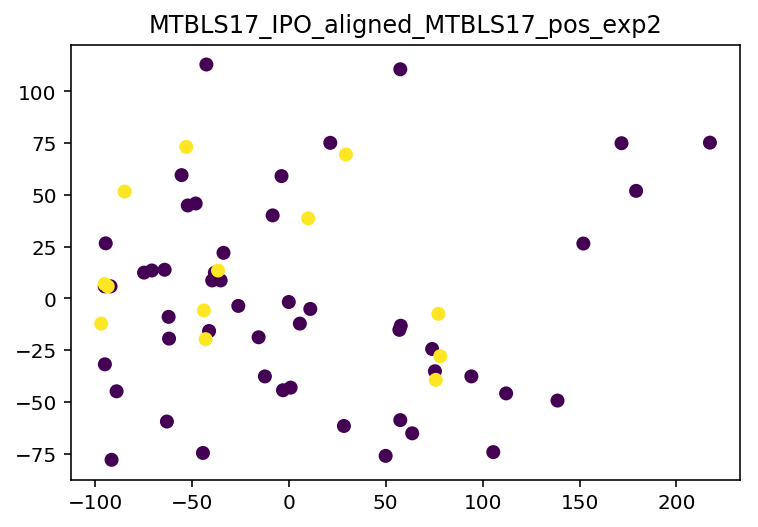

...

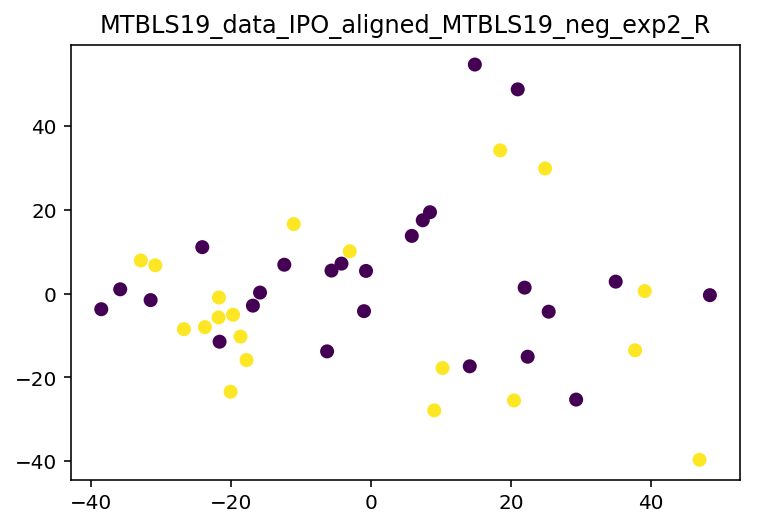

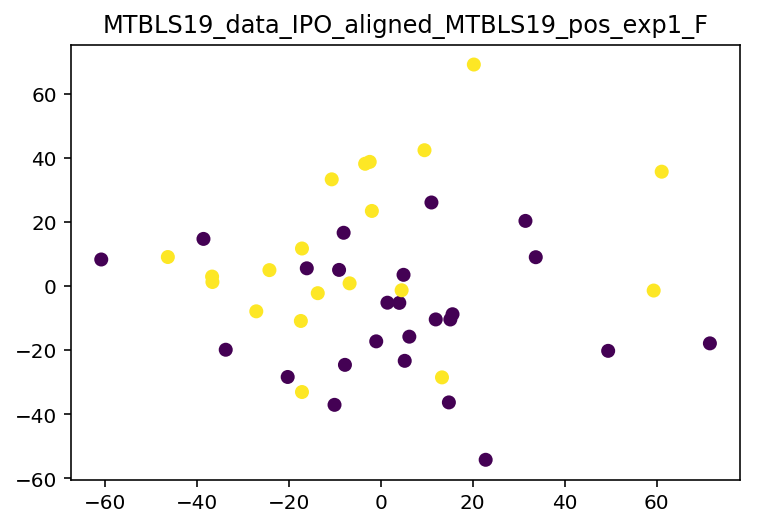

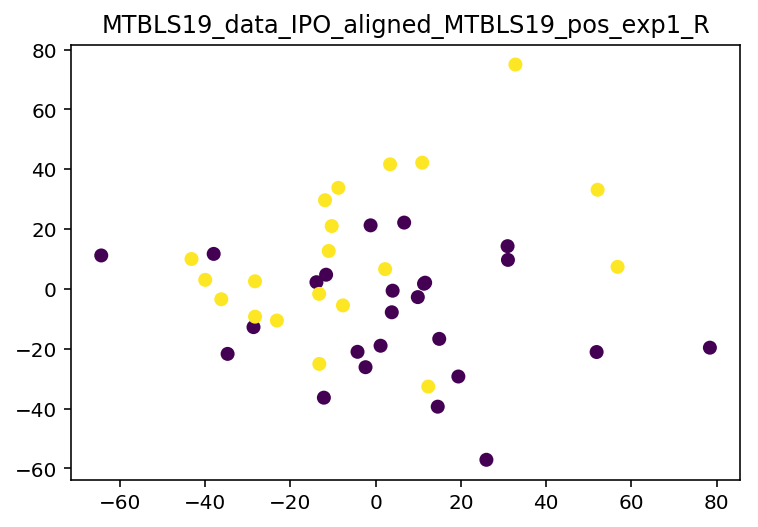

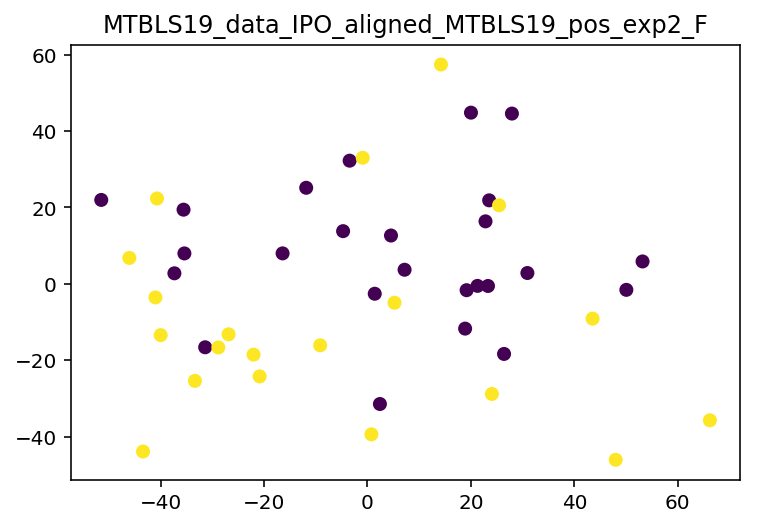

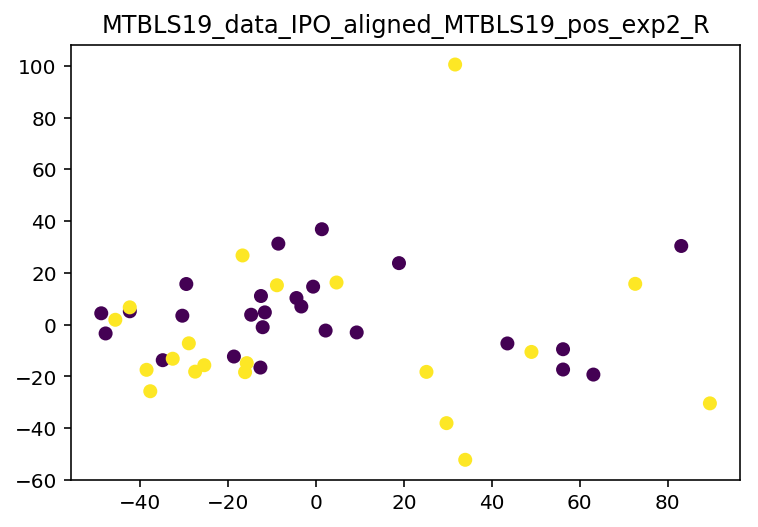

MTBLS200 IPO_aligned_MTBLS200_dilute (<class 'ValueError'>, ValueError('c of shape (111,) not acceptable as a color sequence for x with size 37, y with size 37',), <traceback object at 0x7f8c2fbe0a88>)
MTBLS200 IPO_aligned_MTBLS200_not_dilute (<class 'ValueError'>, ValueError('c of shape (84,) not acceptable as a color sequence for x with size 28, y with size 28',), <traceback object at 0x7f8c2fbe0988>)
MTBLS20 IPO_aligned_MTBLS20_439020_neg (<class 'ValueError'>, ValueError('c of shape (1170,) not acceptable as a color sequence for x with size 26, y with size 26',), <traceback object at 0x7f8c2fbe0dc8>)
MTBLS20 IPO_aligned_MTBLS20_439020_pos (<class 'ValueError'>, ValueError('c of shape (1080,) not acceptable as a color sequence for x with size 24, y with size 24',), <traceback object at 0x7f8c2fbe0488>)


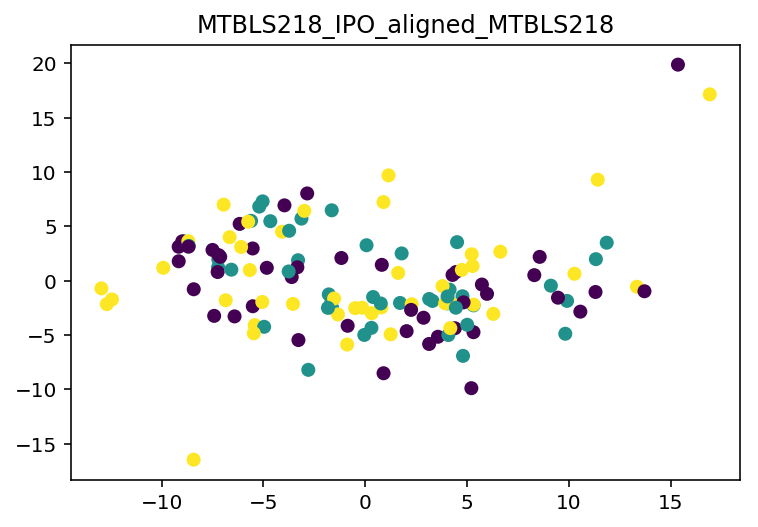

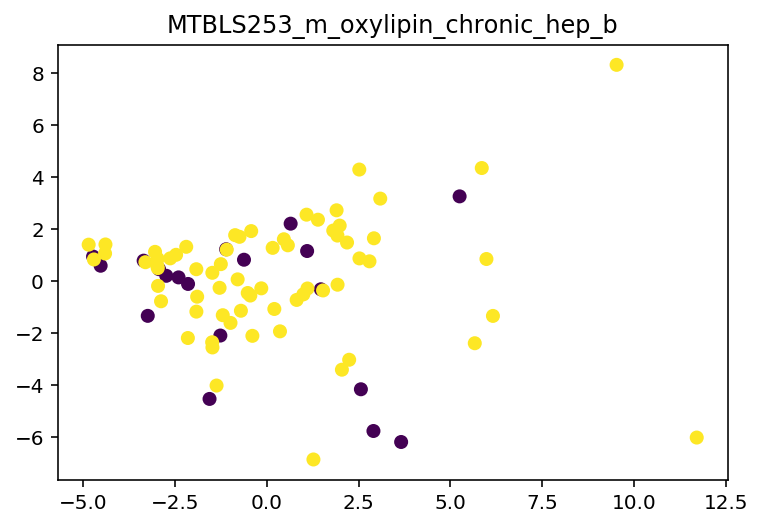

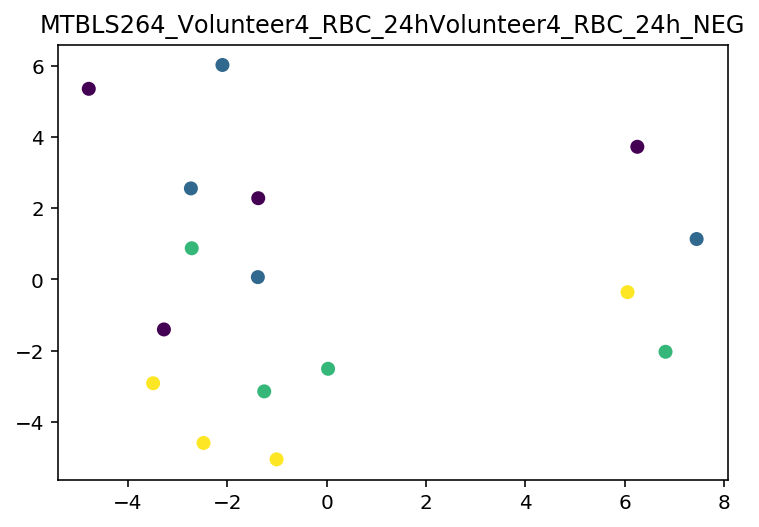

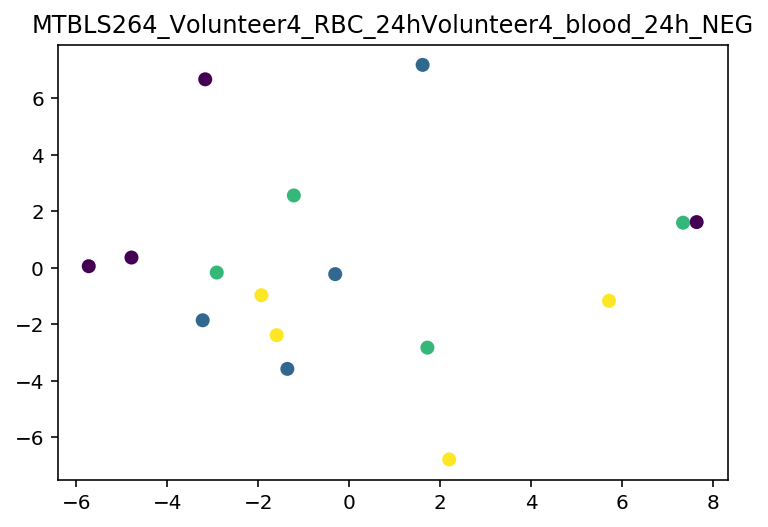

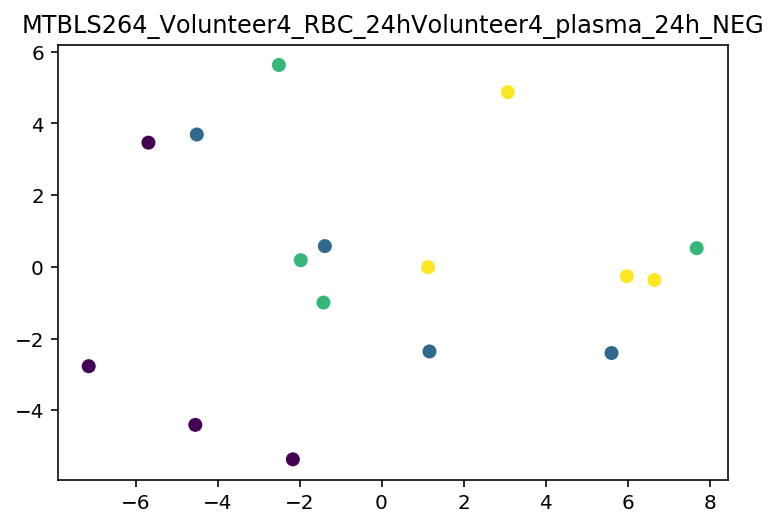

...

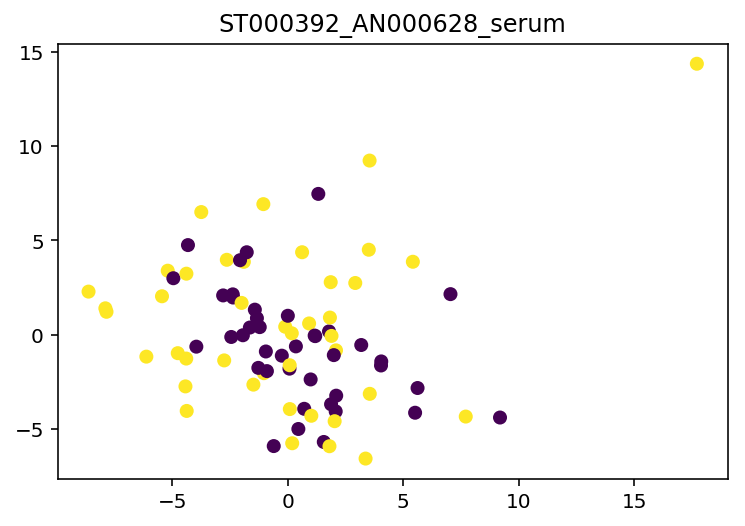

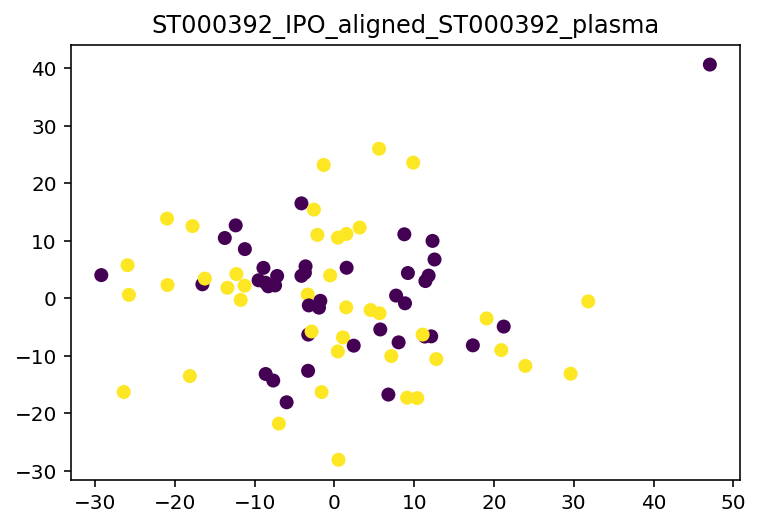

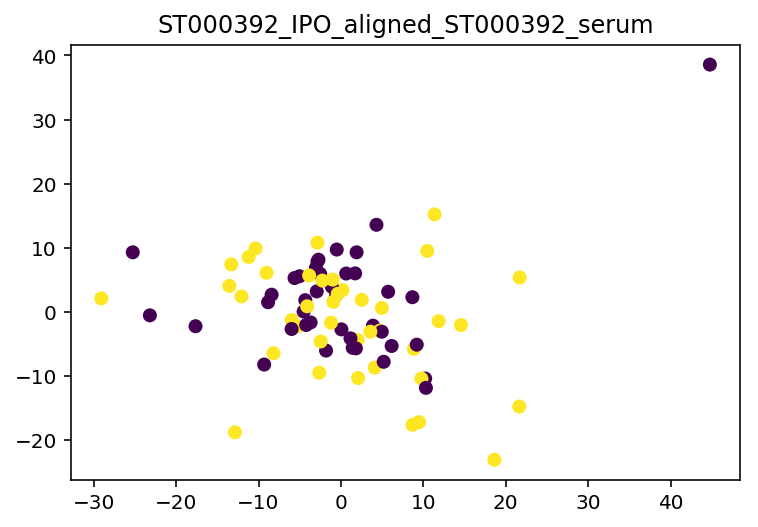

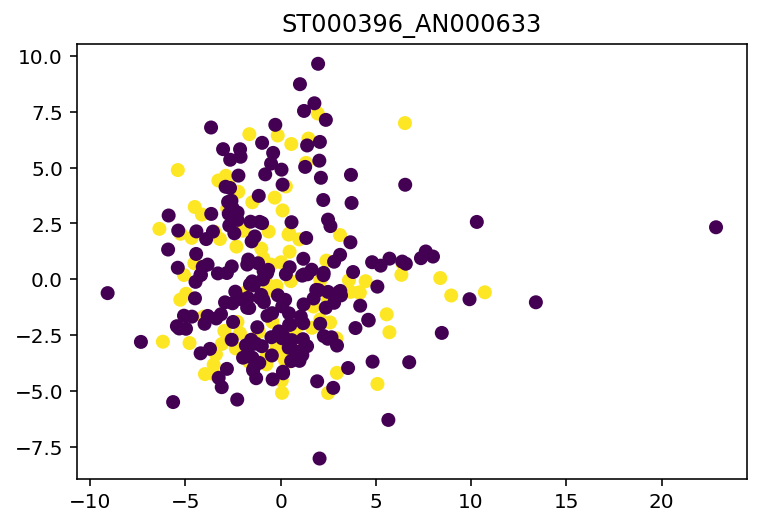

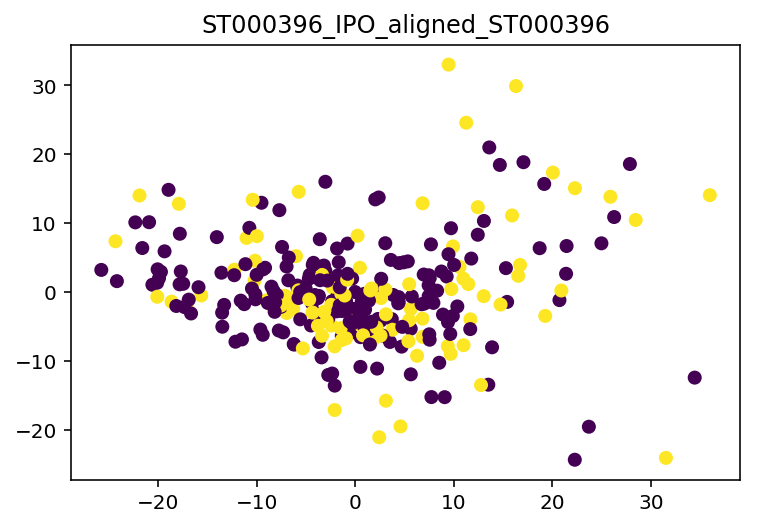

ST000397 AN000634 (<class 'ValueError'>, ValueError('c of shape (48,) not acceptable as a color sequence for x with size 48, y with size 48',), <traceback object at 0x7f8c2fa9ac88>)
ST000397 IPO_aligned_ST000397_pos (<class 'ValueError'>, ValueError('c of shape (48,) not acceptable as a color sequence for x with size 48, y with size 48',), <traceback object at 0x7f8c2fa9a2c8>)


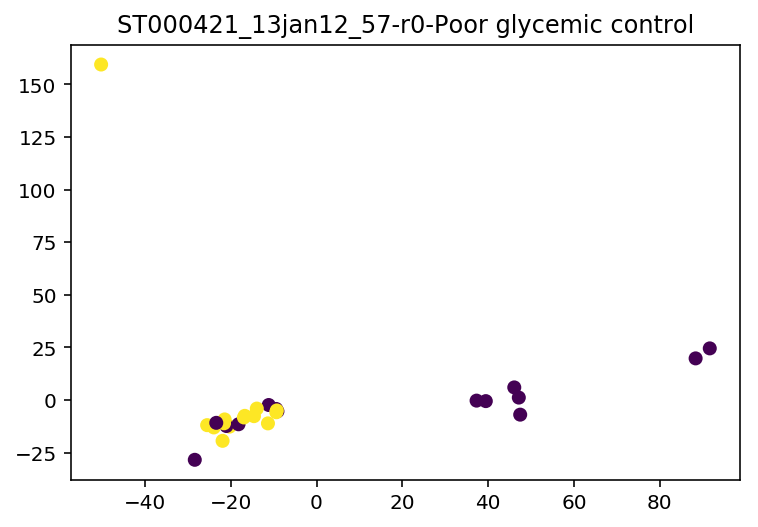

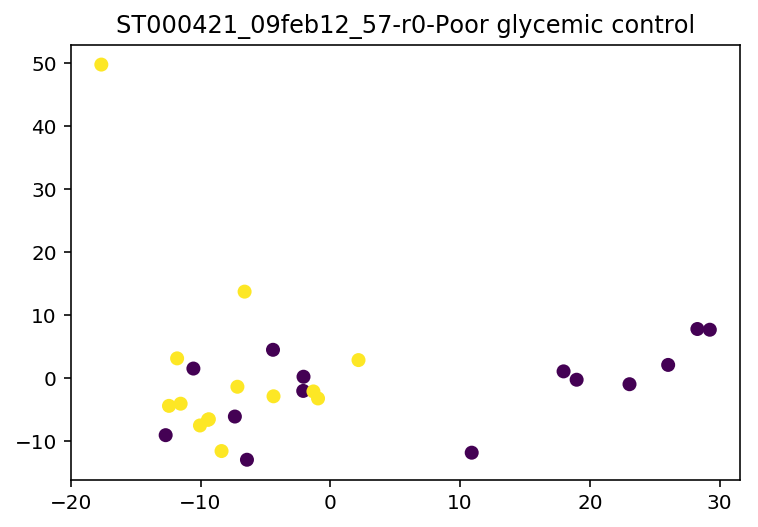

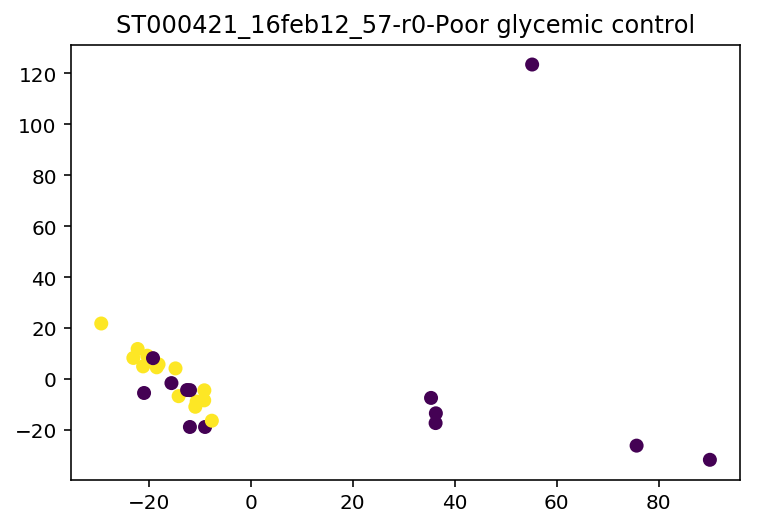

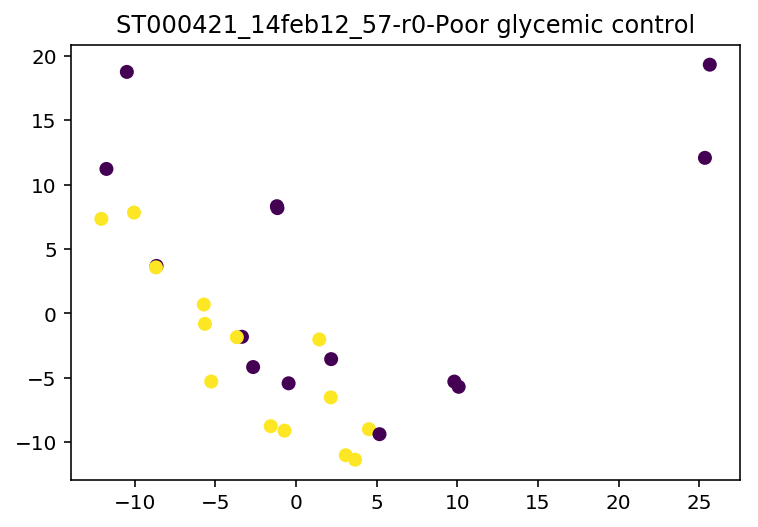

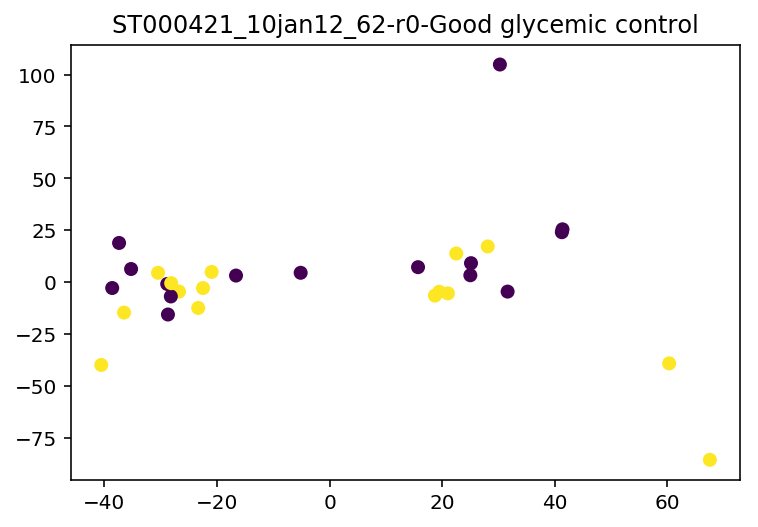

...

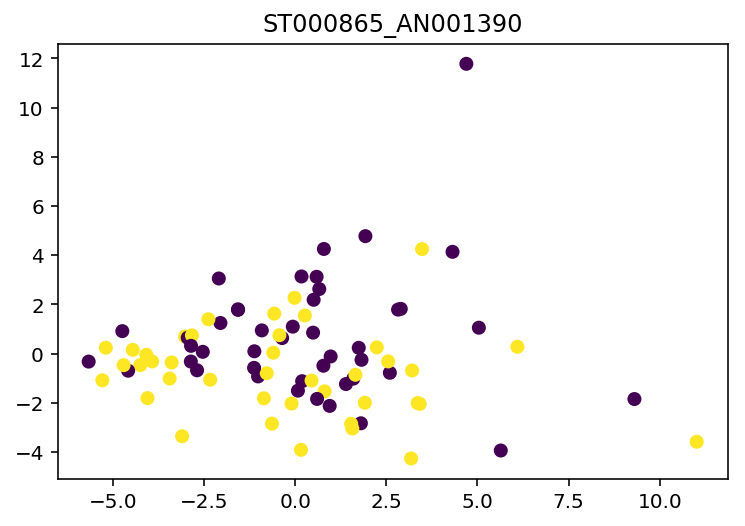

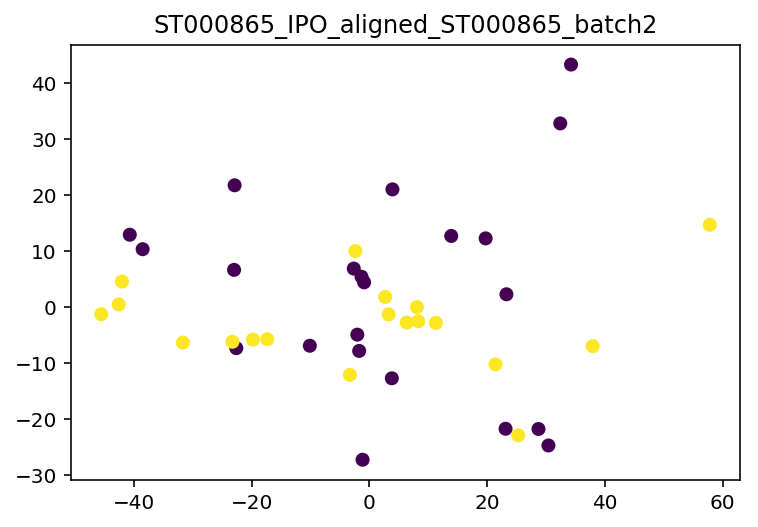

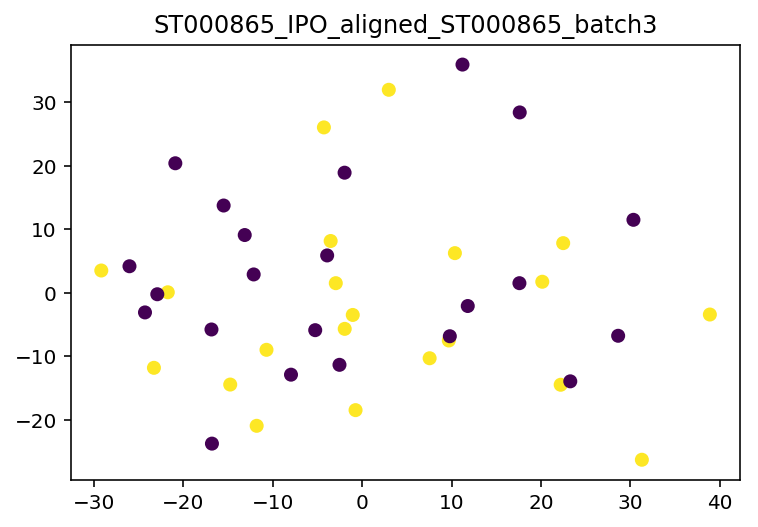

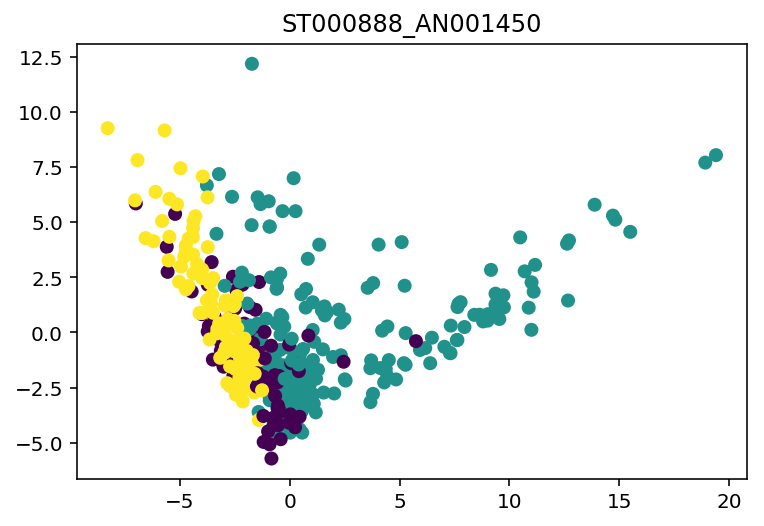

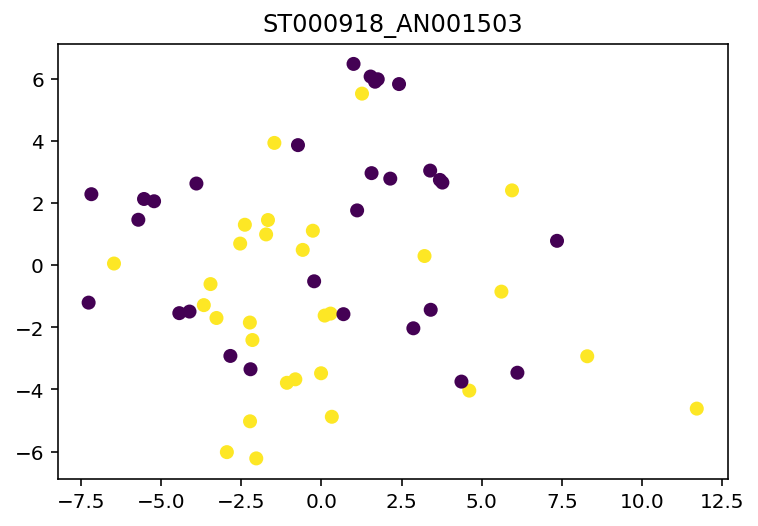

snyder IPO_aligned_snyderome_b1_neg cannot do PCA since no labels
snyder IPO_aligned_snyderome_b1_neg (<class 'AttributeError'>, AttributeError("'str' object has no attribute 'values'",), <traceback object at 0x7f8c344b8488>)
snyder IPO_aligned_snyderome_b2_neg cannot do PCA since no labels
snyder IPO_aligned_snyderome_b2_neg (<class 'AttributeError'>, AttributeError("'str' object has no attribute 'values'",), <traceback object at 0x7f8c2b2f5fc8>)


In [43]:
# use this to look at PCA of all datasets \
import sys
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
for k, v in datasets.items():  
    for ds in v:
#         files = list(ds['features'].index)
#         if ds['data_set'] == 'IPO_aligned_MTBLS92':
#             f = [fi for fi in list(ds['features'].index) if '163' in fi]
#             ds['features'] = ds['features'].loc[f]
#             ds['labels'] = ds['labels'].loc[f]
#         if ds['study'] == 'MTBLS92' and ds['data_set'] == 'Author_data':
#             f = [fi for fi in list(ds['features'].index) if 'A' in fi]
#             ds['features'] = ds['features'].loc[f]
#             ds['labels'] = ds['labels'].loc[f]
        try:
            ds['labels'] = ds['labels']*1
            vals = ds['labels'].values    
        except:
            print(k, ds['data_set'], 'cannot do PCA since no labels')
        X = ds['features'].values.copy()
        X = convert_nan_to_val(X, value=0)
        X[np.isinf(X)] = 0
        value = min(X.shape[1], 50)
        pca = PCA(n_components=value)
        ss = StandardScaler()
        try:
            X = ss.fit_transform(X)
            X_pca = pca.fit_transform(X)
            y = ds['labels'].values.ravel()
            plt.scatter(X_pca[:,0], X_pca[:,1], c=y)
            plt.title(ds['study'] +'_'+ ds['data_set'])
            plt.show()
            #looking at one speific example for batch effects, mapping the batch label to the data in the PCA plot 
            if 'IPO' in ds['data_set'] and ds['study'] == 'MTBLS404':
                files = list(ds['labels'].index)
                filt_samp_extract = ds['samples']['Extract Name'].loc[files]
#                 print(list(filt_samp_extract))
                mask = {f:1 for f in list(filt_samp_extract) if 'b2' in f}
                filt_samp_extract = filt_samp_extract.replace(mask)
                filt_samp_extract[filt_samp_extract!=1] = 0
                plt.scatter(X_pca[:,0], X_pca[:,1], c=filt_samp_extract)
                plt.title(ds['study'] +'_'+ ds['data_set']+'_BATCH_MAP')
                plt.show()
        except: 
            print(ds['study'], ds['data_set'], sys.exc_info())


scatter plot of significant features for all studies that could be analyzed with a MN-U test

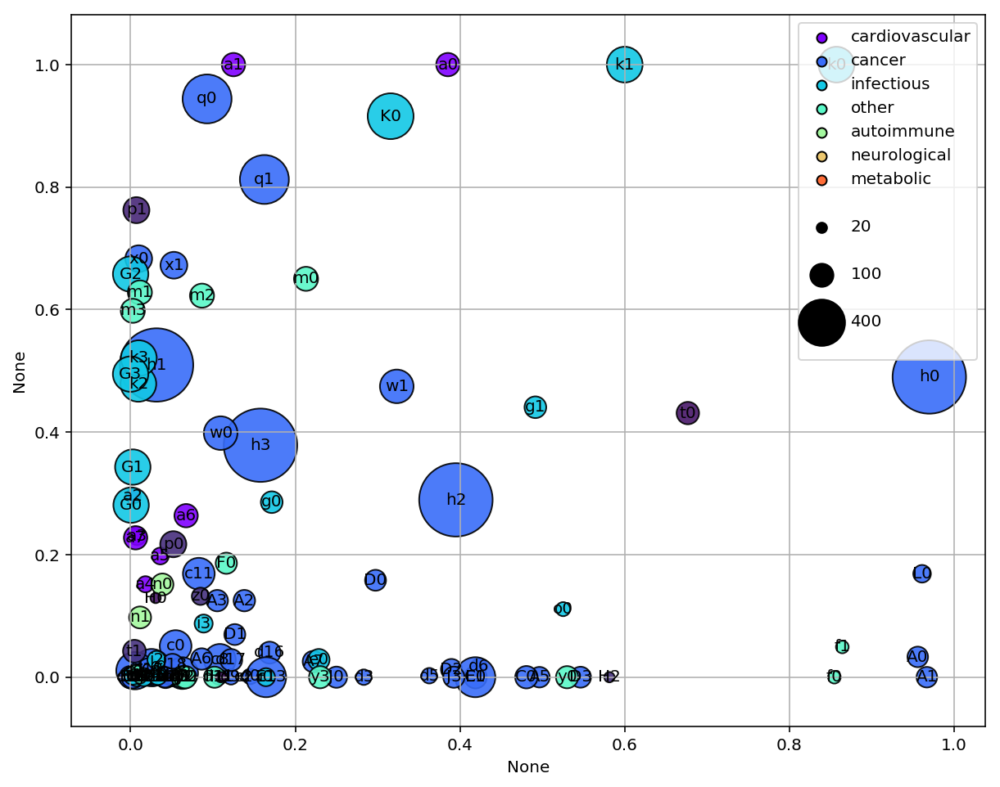

In [57]:
no_original_multi = True
s_no_bn = summary_no_bn.copy()
s_bn = summary_bn.copy()
s_no_bn = df_no_multi(s_no_bn, no_original_multi)
s_bn = df_no_multi(s_bn, no_original_multi)
# summary_w_2 = s_bn.copy()
summary_w_2 = s_no_bn.copy()

# keep_files = list(summary_w_2.index)
# # keep_files = [f for f in keep_files if summary['number_labels'].loc[f] == 2]
# plt.figure(figsize=(10,8))
# scatterplot(summary_w_2.loc[keep_files].features,
#             pd.Series(summary_w_2.loc[keep_files].significant / summary_w_2.loc[keep_files].features, name='proportion of significant features'),
#             summary_w_2.loc[keep_files].samples,
#             summary_w_2.loc[keep_files].disease_type,
#             summary_w_2.loc[keep_files].label,
#             sscale=2,
#             sbins=[20,100,400])
# plt.gca().set_xscale('log')
# plt.xlim([1,1e5])



# from scipy.stats import linregress
# x = summary_w_2.loc[keep_files].samples
# y = pd.Series(summary_w_2.loc[keep_files].significant / summary_w_2.loc[keep_files].features, name='proportion of significant features')
# slope, intercept, r_value, p_value, std_err = linregress(x,y)
# print(slope, p_value, r_value)

# keep_files = list(summary_w_2.index)
# plt.figure(figsize=(10,8))
# plt.plot(x, intercept + slope*x, 'k', label='fitted line')
# plt.text(1.1,1.1, 'p={:2.5f} r-squared={:2.4f}'.format(p_value, r_value**2))
# scatterplot(summary_w_2.loc[keep_files].samples,
#             pd.Series(summary_w_2.loc[keep_files].significant / summary_w_2.loc[keep_files].features, name='proportion of significant features'),
#             summary_w_2.loc[keep_files].samples,
#             summary_w_2.loc[keep_files].disease_type,
#             summary_w_2.loc[keep_files].label,
#             sscale=2,
#             sbins=[20,100,400])

plt.figure(figsize=(10,8))
scatterplot(summary_w_2.model_nonzero_coef/summary_w_2.features,
            summary_w_2.significant/summary_w_2.features,
            summary_w_2.samples,
            summary_w_2.disease_type,
            summary_w_2.label,
            sscale=2,
            sbins=[20,100,400])
# plt.gca().set_xscale('log')
# plt.xlim([8,1100])

124


(-0.05, 1.05)

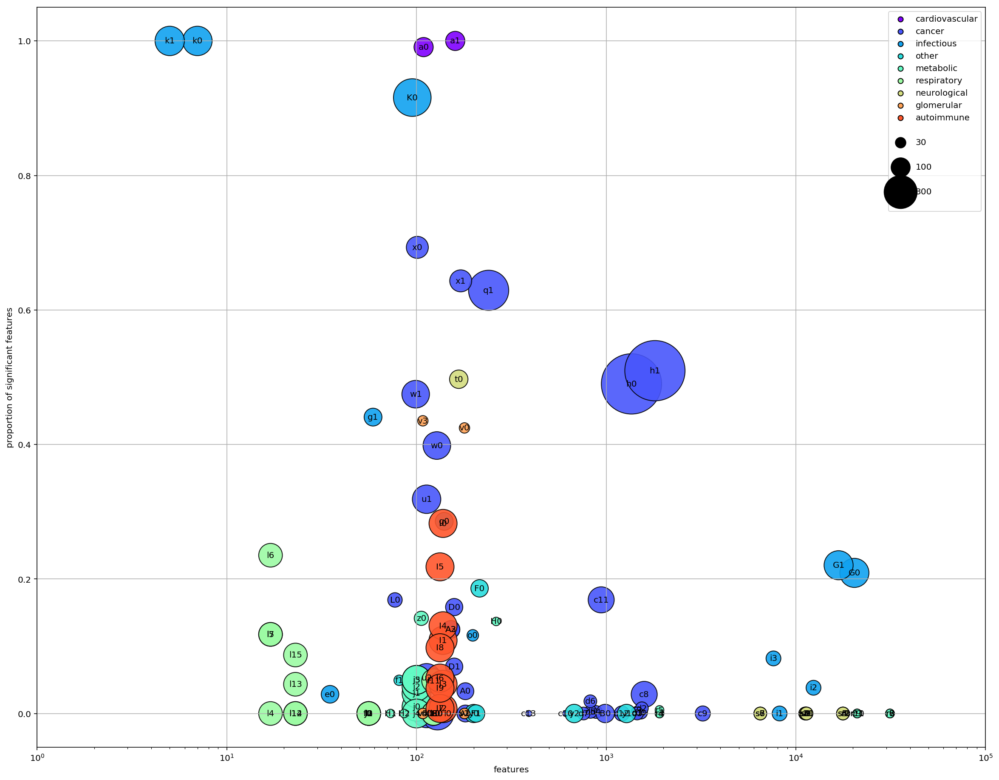

In [73]:
# Author data only:
keep_files = list(summary_bn.index)
# keep_files = [f for f in keep_files if summary['significant'].loc[f] != 'Cannot run U-test']
# keep_files = [f for f in keep_files if summary['number_labels'].loc[f] == 2]
keep_files = [f for f in keep_files if 'IPO' not in summary_bn['analysis'].loc[f] and 'XCMS'not in summary_bn['analysis'].loc[f]]
print(len(keep_files))
plt.figure(figsize=(20,16))
scatterplot(summary_bn.loc[keep_files].features,
            pd.Series(summary_bn.loc[keep_files].significant / summary_bn.loc[keep_files].features, name='proportion of significant features'),
            summary_bn.loc[keep_files].samples,
            summary_bn.loc[keep_files].disease_type,
            summary_bn.loc[keep_files].label,
            sscale=5,
            sbins=[30,100,300])
plt.gca().set_xscale('log')
plt.xlim([1,1e5])
plt.ylim([-0.05,1.05])

(-0.05, 1.05)

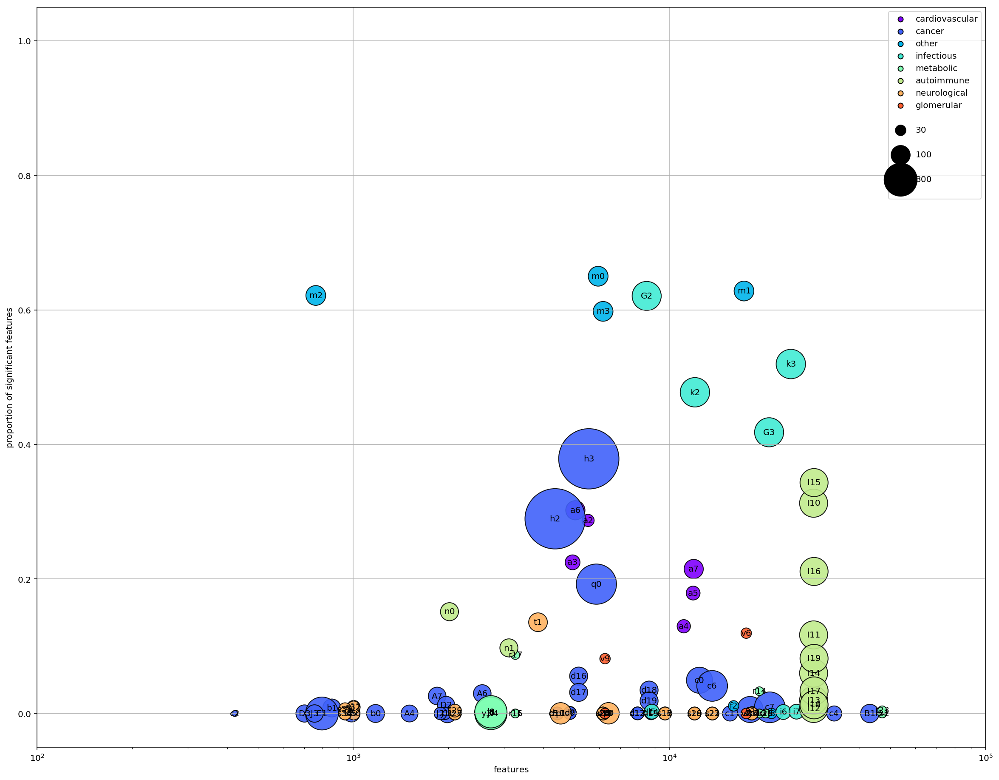

In [74]:
# My reprocessed data:
keep_files = list(summary_bn.index)
# keep_files = [f for f in keep_files if summary['significant'].loc[f] != 'Cannot run U-test']
# keep_files = [f for f in keep_files if summary['number_labels'].loc[f] == 2]
keep_files = [f for f in keep_files if 'IPO' in summary_bn['analysis'].loc[f] or 'XCMS' in summary_bn['analysis'].loc[f]]
plt.figure(figsize=(20,16))
scatterplot(summary_bn.loc[keep_files].features,
            pd.Series(summary_bn.loc[keep_files].significant / summary_bn.loc[keep_files].features, name='proportion of significant features'),
            summary_bn.loc[keep_files].samples,
            summary_bn.loc[keep_files].disease_type,
            summary_bn.loc[keep_files].label,
            sscale=5,
            sbins=[30,100,300])
plt.gca().set_xscale('log')
plt.xlim([100,1e5])
plt.ylim([-0.05,1.05])

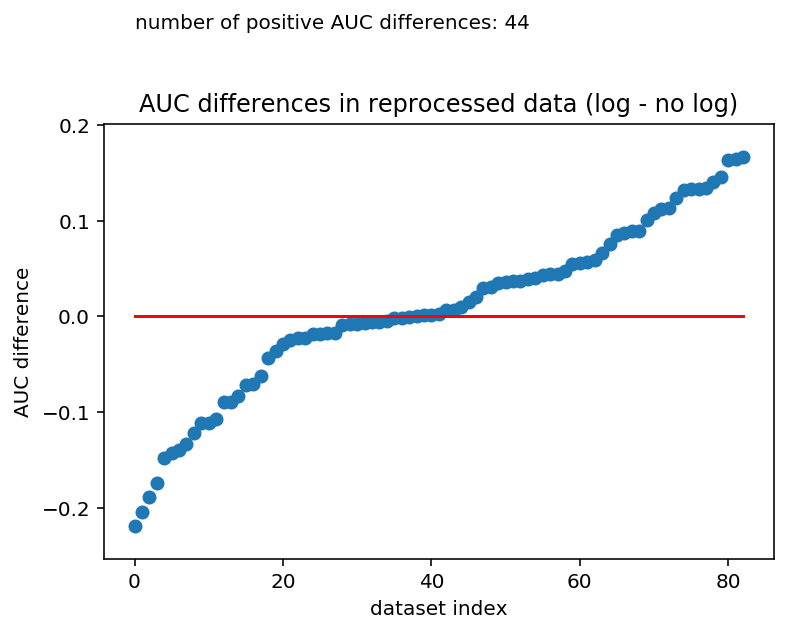

In [48]:
# for plotting the auc difference between log and no log processing
plt.scatter(index, sorted(aucs_diff))
plt.title('AUC differences in reprocessed data (log - no log)')
plt.ylabel('AUC difference')
plt.xlabel('dataset index')
plt.text(0, 0.3, 'number of positive AUC differences: %d' %(len(aucs_diff[aucs_diff > 0])))
plt.plot(index, [0 for i in index], 'r')

serum_IPO_aligned_Feng_serum_batch1
serum_IPO_aligned_Feng_serum_batch2
urine_IPO_aligned_Feng_urine_batch1
urine_IPO_aligned_Feng_urine_batch2
serum_onebatch_IPO_align_Feng_serum_all
urine_onebatch_IPO_aligned_Feng_urine_all
IPO_aligned_MTBLS105_qMS
IPO_aligned_MTBLS105_SIM-MS
IPO_aligned_MTBLS17_neg_exp1
IPO_aligned_MTBLS17_neg_exp2
IPO_aligned_MTBLS17_neg_exp3
IPO_aligned_MTBLS17_pos_exp1
IPO_aligned_MTBLS17_pos_exp2
IPO_aligned_MTBLS17_pos_exp3
IPO_aligned_MTBLS17_neg_onebatch
IPO_aligned_MTBLS17_pos_onebatch
IPO_aligned_MTBLS19_neg_exp1_F
IPO_aligned_MTBLS19_neg_exp1_R
IPO_aligned_MTBLS19_neg_exp2_F
IPO_aligned_MTBLS19_neg_exp2_R
IPO_aligned_MTBLS19_pos_exp1_F
IPO_aligned_MTBLS19_pos_exp1_R
IPO_aligned_MTBLS19_pos_exp2_F
IPO_aligned_MTBLS19_pos_exp2_R
IPO_aligned_MTBLS19_neg_all_F_R
IPO_aligned_MTBLS19_neg_all_R_R
IPO_aligned_MTBLS19_pos_all_F_R
IPO_aligned_MTBLS19_pos_all_R_R
IPO_aligned_MTBLS266_neg
IPO_aligned_MTBLS266_pos
IPO_aligned_MTBLS28_neg
IPO_aligned_MTBLS28_pos
IPO_ali

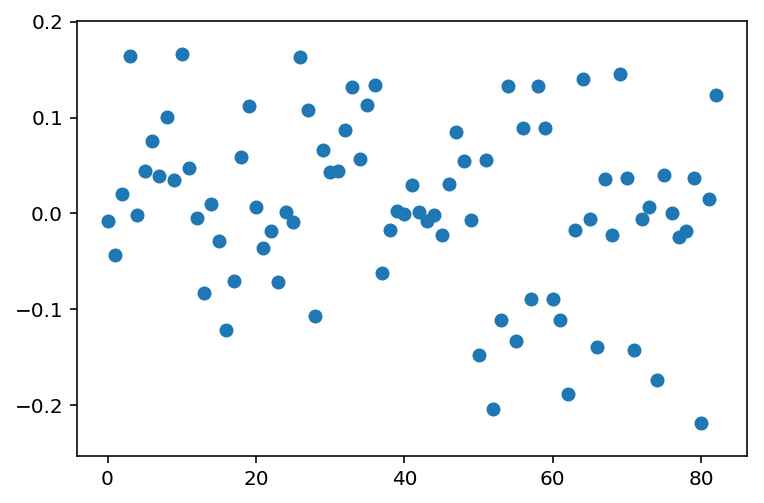

In [46]:
# This cell is for getting AUCs with and without log so I can plot them together
aucs_no_log = []
aucs_log = []
for k, v in datasets.items():  
    for ds in v:       
        ds = get_num_labels(ds)            
        
        if "IPO" not in ds['data_set'] and 'XCMS' not in ds['data_set'] :
            continue
        print(ds['data_set'])
        y = ds['labels'].values.copy().ravel().astype(int)
        X = ds['features'].values.copy()
        X = convert_nan_to_val(X, value=0)
        X[np.isinf(X)] = 0

        # no log first:
        ds['auc'], ds['auc_std'], ds['train_size'], ds['test_size'], ds['clf'], ds['multi_auc'] = fit_model(X, y, ds)
        aucs_no_log.append(ds['auc'])
        # now with log
        X[X==0] = 1
        X = np.log2(X)
        ds['auc'], ds['auc_std'], ds['train_size'], ds['test_size'], ds['clf'], ds['multi_auc'] = fit_model(X, y, ds)
        
        aucs_log.append(ds['auc'])
aucs_no_log = np.asarray(aucs_no_log)
aucs_log = np.asarray(aucs_log)
aucs_diff = aucs_log - aucs_no_log
index = [i for i in range(aucs_diff.shape[0])]
plt.scatter(index, aucs_diff)
plt.show()

Code to make a nice AUC plot is in here!!!

Looks like on the following studies that sometime log2 helps remove the auc of 0.5 but also running lr and not lrCV

In [4]:
def get_ROC_data(X, y):
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
    clf = GridSearchCV(estimator=LogisticRegression(penalty='l1',
                                                    solver='liblinear',
                                                    tol=1e-3,
                                                    intercept_scaling=10, # very large hurts liblinear convergence
                                                    max_iter=500,
                                                    random_state=seed),
                       cv=StratifiedKFold(5, random_state=seed+1),
                       param_grid={'C': 10.**np.linspace(-4,4)},
                       n_jobs=-1,
                       scoring='roc_auc')
    clf.fit(x_train, y_train)
    y_pred = clf.decision_function(x_test)
    fpr, tpr, _ = roc_curve(y_test, y_pred)
    return fpr, tpr
def logistic_regression(X, y, seed):
#     print(X)
#     X[:,:-3] = np.log(X[X != 0])
#     print(X)
    X = StandardScaler().fit_transform(X)
    clf = GridSearchCV(estimator=LogisticRegression(penalty='l1',
                                                    solver='liblinear',
                                                    tol=1e-3,
                                                    intercept_scaling=10, # very large hurts liblinear convergence
                                                    max_iter=500,
                                                    random_state=seed),
                       cv=StratifiedKFold(5, random_state=seed+1),
                       param_grid={'C': 10.**np.linspace(-4,4)},
                       n_jobs=-1,
                       scoring='roc_auc')
    auc = cross_val_score(clf, X, y,
                          scoring='roc_auc',
                          cv=StratifiedKFold(3, random_state=seed+2))
    return auc.mean()

In [85]:
#serum_IPO_aligned_Feng_serum_batch2
# 17: PO_aligned_MTBLS17_neg_exp2, 3, pos_1, pos_2, Peaklist_EXP1_POS, Peaklist_EXP3_POS, Peaklist_EXP1_NEG
# ST389: both
# ST421: both
# ST726: IPO

import sys
from sklearn.preprocessing import StandardScaler

# studies = ['Feng', 'MTBLS17', 'MTBLS364', 'ST000388', 'ST000389', 'ST000421', 'ST000726', 'ST000578']
studies = ['MTBLS17']
base_fpr = np.linspace(0,1,101)
for k, v in datasets.items():
    if k not in studies:
        continue
    else:
        for ds in v:
#             if ds['data_set'] != 'IPO_aligned_MTBLS17_pos_exp2':
#                 continue
#             print(ds['data_set'])
            
            tprs = []
            y = ds['labels'].values.copy().ravel().astype(int)
            X = ds['features'].values.copy()
            X = convert_nan_to_val(X, value=0)
            X[np.isinf(X)] = 0
            print(X.shape)
            
            X,y = shuffle(X,y)
            clf = LogisticRegressionCV(penalty='l1', solver='liblinear', tol=1e-4, intercept_scaling=10, max_iter=500, refit=True)
            cv = StratifiedKFold(n_splits=3, shuffle=True)
            aucs = []
            for train, test in cv.split(X,y):
                x_train, y_train = X[train], y[train]
                x_test,y_test = X[test], y[test]
                scaler = StandardScaler()
                x_train = scaler.fit_transform(x_train)
                x_test = scaler.transform(x_test)
                clf.fit(x_train, y_train)
                y_pred = clf.predict_proba(x_test)
                fpr, tpr, _ = roc_curve(y_test, y_pred[:,1])
                auc_value = metrics.auc(fpr, tpr)
                aucs.append(auc_value)
        #         plt.plot(fpr, tpr, 'b', alpha=0.15) #, label='AUC = %0.2f' % auc_values)
                tpr = interp(base_fpr, fpr, tpr)
                tpr[0] = 0.0 #just to make it start at 0
                tprs.append(tpr)
            
            tprs = np.array(tprs)
            mean_tprs = tprs.mean(axis=0)
            std = tprs.std(axis=0)
            tprs_upper = np.minimum(mean_tprs + std, 1)
            tprs_lower = mean_tprs - std
            aucs = np.asarray(aucs)
            print(ds['data_set'], aucs.mean())
            if aucs.mean() == 0.5 or aucs.mean() == 1.0:
#                 print(y_pred)
                print('rerunning')
                X,y = shuffle(X,y)
                tprs = []
#                 X[X==0] = 1
#                 X = np.log2(X)
                clf = LogisticRegressionCV(penalty='l1', solver='liblinear', tol=1e-4, intercept_scaling=10, max_iter=500, refit=True)
#                 clf = LogisticRegression(penalty='l1', solver='liblinear', tol=1e-4, intercept_scaling=10, max_iter=500)
                cv = StratifiedKFold(n_splits=3, shuffle=True)
                aucs = []
                for train, test in cv.split(X,y):
                    x_train, y_train = X[train], y[train]
                    x_test,y_test = X[test], y[test]
                    scaler = StandardScaler()
                    x_train = scaler.fit_transform(x_train)
                    x_test = scaler.transform(x_test)
                    clf.fit(x_train, y_train)
                    y_pred = clf.predict_proba(x_test)
                    fpr, tpr, _ = roc_curve(y_test, y_pred[:,1])
                    auc_value = metrics.auc(fpr, tpr)
                    aucs.append(auc_value)
            #         plt.plot(fpr, tpr, 'b', alpha=0.15) #, label='AUC = %0.2f' % auc_values)
                    tpr = interp(base_fpr, fpr, tpr)
                    tpr[0] = 0.0 #just to make it start at 0
                    tprs.append(tpr)

                tprs = np.array(tprs)
                mean_tprs = tprs.mean(axis=0)
                std = tprs.std(axis=0)
                tprs_upper = np.minimum(mean_tprs + std, 1)
                tprs_lower = mean_tprs - std
                aucs = np.asarray(aucs)     
                print(aucs.mean())
#             plt.plot(base_fpr, mean_tprs, 'b',linewidth=4.0, label='Mean ROC - AUC = %0.2f $\pm$ %0.2f' %(aucs.mean(),aucs.std()))
#             plt.fill_between(base_fpr, tprs_lower, tprs_upper, color='grey', alpha=0.3, label='$\pm$ 1 stdev')
#             plt.plot([0, 1], [0, 1],'r--', linewidth=1.0, label='Luck') 
#             plt.xlim([-0.05, 1.05])
#             plt.ylim([-0.05, 1.05])
#             plt.xlabel('False Positive Rate')
#             plt.ylabel('True Positive Rate')
#             plt.title(ds['data_set'], fontsize=15)
#             leg = plt.legend(loc='lower right', fontsize=10, framealpha=0.3)
#             ax = plt.gca()
#             ax.get_xaxis().set_tick_params(direction='out', width=1)
#             ax.get_yaxis().set_tick_params(direction='out', width=1)
#             ax.yaxis.set_ticks_position('left')
#             ax.xaxis.set_ticks_position('bottom')
#             plt.show()    
# #             plt.savefig('ROC_analysis_%s.png' % ds)
# #             plt.gcf().clear()

(188, 12445)
IPO_aligned_MTBLS17_neg_exp1 0.5662994696042432
(64, 15547)
IPO_aligned_MTBLS17_neg_exp2 0.5
rerunning
0.46875
(10, 422)
IPO_aligned_MTBLS17_neg_exp3 0.6666666666666666
(189, 17998)
IPO_aligned_MTBLS17_pos_exp1 0.512015503875969
(63, 33205)
IPO_aligned_MTBLS17_pos_exp2 0.49411764705882355
(10, 4299)
IPO_aligned_MTBLS17_pos_exp3 0.9166666666666666
(189, 1586)
Peaklist_EXP1_POS 0.5426356589147286
(63, 3230)
Peaklist_EXP2_POS 0.5588235294117647
(10, 612)
Peaklist_EXP3_POS 0.75
(188, 941)
Peaklist_EXP1_NEG 0.603875968992248
(63, 1209)
Peaklist_EXP2_NEG 0.45098039215686275
(10, 391)
Peaklist_EXP3_NEG 1.0
rerunning
1.0
